# Smart Soil Crop Recommender Dataset

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
df= pd.read_csv('./Agri.csv')
df

,N,P,K,ph,EC,S,Cu,Fe,Mn,Zn,B,label
0,143,69,217,5.9,0.58,0.23000,10.20,116.35,59.96,54.85,21.29,pomegranate
1,170,36,216,5.9,0.15,0.28000,15.69,114.20,56.87,31.28,28.62,pomegranate
2,158,66,219,6.8,0.34,0.20000,15.29,65.87,51.81,57.12,27.59,pomegranate
3,133,45,207,6.4,0.94,0.21000,8.48,103.10,43.81,68.50,47.29,pomegranate
4,132,48,218,6.7,0.54,0.19000,5.59,63.40,56.40,46.71,31.04,pomegranate
...,...,...,...,...,...,...,...,...,...,...,...,...
615,41,23,135,5.0,1.67,0.10655,26.00,39.20,206.89,31.09,20.64,potato
616,49,45,90,5.8,1.98,0.09229,19.00,40.20,91.12,32.68,14.91,potato
617,131,24,121,4.9,2.24,0.08775,22.00,40.00,94.34,24.93,23.74,potato
618,131,55,130,5.3,2.48,0.08983,15.00,41.00,92.58,45.73,21.48,potato


# Exploratory Analysis

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 620 entries, 0 to 619
Data columns (total 12 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   N       620 non-null    int64  
 1   P       620 non-null    int64  
 2   K       620 non-null    int64  
 3   ph      620 non-null    float64
 4   EC      620 non-null    float64
 5   S       620 non-null    float64
 6   Cu      620 non-null    float64
 7   Fe      620 non-null    float64
 8   Mn      620 non-null    float64
 9   Zn      620 non-null    float64
 10  B       620 non-null    float64
 11  label   620 non-null    object 
dtypes: float64(8), int64(3), object(1)
memory usage: 58.3+ KB


In [6]:
df.describe().round(2)

,N,P,K,ph,EC,S,Cu,Fe,Mn,Zn,B
count,620.00,620.00,620.00,620.00,620.00,620.00,620.00,620.00,620.00,620.00,620.00
mean,135.70,52.51,161.40,6.11,0.89,0.48,17.32,117.21,219.91,34.34,28.75
std,31.81,24.67,81.29,0.69,0.64,5.78,6.44,62.78,342.00,11.54,19.64
min,30.00,10.00,51.00,4.50,0.01,0.01,0.18,3.81,20.58,17.99,1.02
25%,116.00,30.00,89.00,5.70,0.30,0.09,12.59,68.31,58.78,24.73,13.44
50%,138.00,54.00,157.50,6.10,0.78,0.17,16.91,108.24,73.58,31.42,23.22
75%,160.00,75.00,206.00,6.50,1.39,0.24,21.10,155.62,163.67,43.54,42.77
max,198.00,100.00,369.00,8.00,2.48,113.20,35.00,276.72,1572.54,70.00,74.56


In [7]:
df.isnull().sum()

N        0
P        0
K        0
ph       0
EC       0
S        0
Cu       0
Fe       0
Mn       0
Zn       0
B        0
label    0
dtype: int64

In [8]:
df[['N','P','K']]

,N,P,K
0,143,69,217
1,170,36,216
2,158,66,219
3,133,45,207
4,132,48,218
...,...,...,...
615,41,23,135
616,49,45,90
617,131,24,121
618,131,55,130


In [9]:
df["label"].unique()

array(['pomegranate', 'mango', 'grapes', 'mulberry', 'ragi', 'potato'],
      dtype=object)

In [10]:
df['label'].value_counts()

label
pomegranate    104
mango          104
grapes         104
mulberry       104
ragi           104
potato         100
Name: count, dtype: int64

In [11]:
df.query("label == 'mulberry'")

,N,P,K,ph,EC,S,Cu,Fe,Mn,Zn,B,label
312,133,25,64,6.8,0.78,0.2390,29.19,211.08,995.84,29.70,26.51,mulberry
313,129,29,55,6.0,0.53,0.2950,22.48,164.02,305.54,26.34,16.09,mulberry
314,133,14,110,6.2,0.85,0.2970,17.95,108.88,1490.60,24.48,13.55,mulberry
315,147,15,75,6.1,0.23,0.2400,31.40,258.32,986.31,24.64,24.99,mulberry
316,116,22,76,6.4,0.43,0.2480,30.93,276.72,563.72,27.87,21.10,mulberry
...,...,...,...,...,...,...,...,...,...,...,...,...
411,131,28,81,6.4,0.11,0.2010,26.87,254.40,272.03,25.62,12.87,mulberry
412,194,76,260,6.2,1.24,0.0123,23.21,49.89,67.56,24.75,8.91,mulberry
413,142,77,269,7.0,0.93,0.0123,18.20,126.21,62.11,25.10,8.69,mulberry
414,102,32,67,5.8,1.56,113.2000,0.18,3.81,184.11,37.86,11.32,mulberry


In [12]:
df.query("(ph>6) and (label=='ragi')")

,N,P,K,ph,EC,S,Cu,Fe,Mn,Zn,B,label
416,174,79,300,7.7,1.65,0.0216,12.23,163.19,65.96,18.22,7.49,ragi
417,147,96,346,6.3,0.85,0.0121,15.11,206.88,60.28,20.08,4.32,ragi
418,164,96,242,6.2,0.78,0.0170,18.33,76.05,55.59,18.42,6.88,ragi
419,179,86,301,7.7,0.84,0.0205,13.76,248.54,59.01,26.88,8.39,ragi
420,160,73,359,7.3,1.39,0.0215,24.84,55.53,57.12,24.11,9.13,ragi
...,...,...,...,...,...,...,...,...,...,...,...,...
509,129,65,320,6.9,0.78,0.0148,22.20,223.94,59.87,22.28,6.98,ragi
512,165,97,264,6.2,1.72,0.0210,15.15,221.98,59.52,25.18,7.34,ragi
513,178,93,343,6.6,1.40,0.0210,20.62,223.95,68.08,23.10,1.65,ragi
514,197,79,259,6.1,1.27,0.0135,23.41,50.07,68.98,24.25,8.89,ragi


In [13]:
df[['N', 'P', 'K']].mean()

N    135.701613
P     52.508065
K    161.401613
dtype: float64

In [14]:
# Average nutrient contribution for each Plantation
avg_nutrients=df.groupby(by='label')[['N', 'P', 'K']].agg("mean").round(2)
avg_nutrients

,N,P,K
label,,,
grapes,139.82,47.51,83.73
mango,114.74,78.16,157.46
mulberry,144.41,21.36,86.00
pomegranate,153.08,48.74,193.11
potato,108.88,44.27,152.22
ragi,152.25,74.69,295.54


In [15]:
# Finding min & max values for PH & EC
df.groupby(by="label")[["ph","EC"]].agg(["min","max"]).round(2)

ph         EC      
             min  max   min   max
label                            
grapes       5.5  7.2  0.11  1.45
mango        4.5  7.0  0.23  1.50
mulberry     5.8  7.0  0.10  1.89
pomegranate  5.6  7.2  0.01  1.16
potato       4.6  6.0  1.08  2.48
ragi         4.9  8.0  0.14  2.45

In [16]:
df['N_percent'] = (df['N'] / (df['N'] + df['P'] + df['K'])) * 100
df['P_percent'] = (df['P'] / (df['N'] + df['P'] + df['K'])) * 100
df['K_percent'] = (df['K'] / (df['N'] + df['P'] + df['K'])) * 100
df[['N_percent', 'P_percent', 'K_percent']].head()

,N_percent,P_percent,K_percent
0,33.333333,16.083916,50.582751
1,40.284360,8.530806,51.184834
2,35.665914,14.898420,49.435666
3,34.545455,11.688312,53.766234
4,33.165829,12.060302,54.773869


The table shows soil nutrient composition, highlighting potassium (K,50%) as dominant, supporting crop growth, while nitrogen (N, 30–40%) aids plant and leafy development. Phosphorus (P, <20%) appears deficient, suggesting supplementation. The variation across rows indicates diverse soil conditions, recommending nutrient application tailored to crop needs. High potassium-requiring crops are suitable, with careful nitrogen and phosphorus management for optimal yield.

# Visualizations

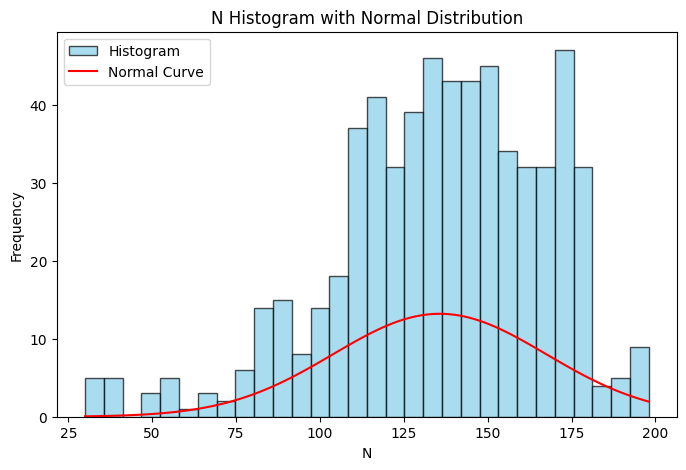

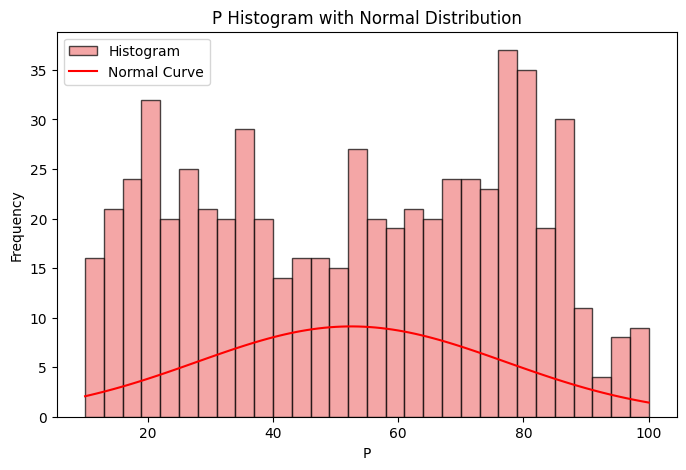

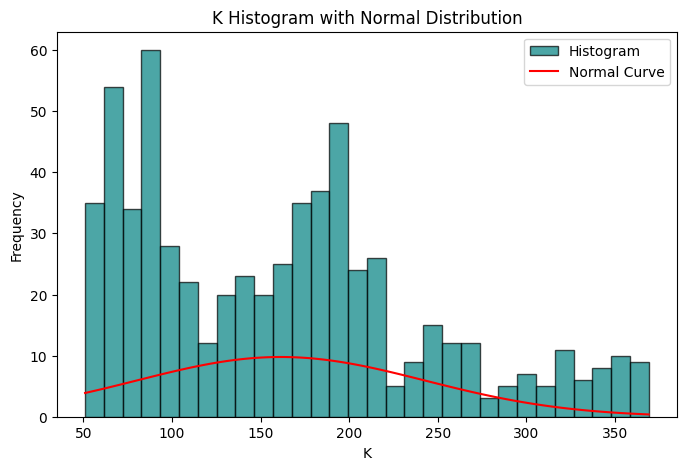

In [19]:
from scipy.stats import norm

features = ['N', 'P', 'K']
distinct_colors = ['skyblue', 'lightcoral', 'teal']

for feature, color in zip(features, distinct_colors):
    plt.figure(figsize=(8, 5))

    plt.hist(df[feature], bins=30, color=color, alpha=0.7, edgecolor='black', label='Histogram')

    mean, sigma = df[feature].mean(), df[feature].std()
    x = np.linspace(df[feature].min(), df[feature].max(), 100)
    plt.plot(x, norm.pdf(x, mean, sigma) * len(df) * (x[1] - x[0]), color='red', label='Normal Curve')

    plt.title(f'{feature} Histogram with Normal Distribution')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()

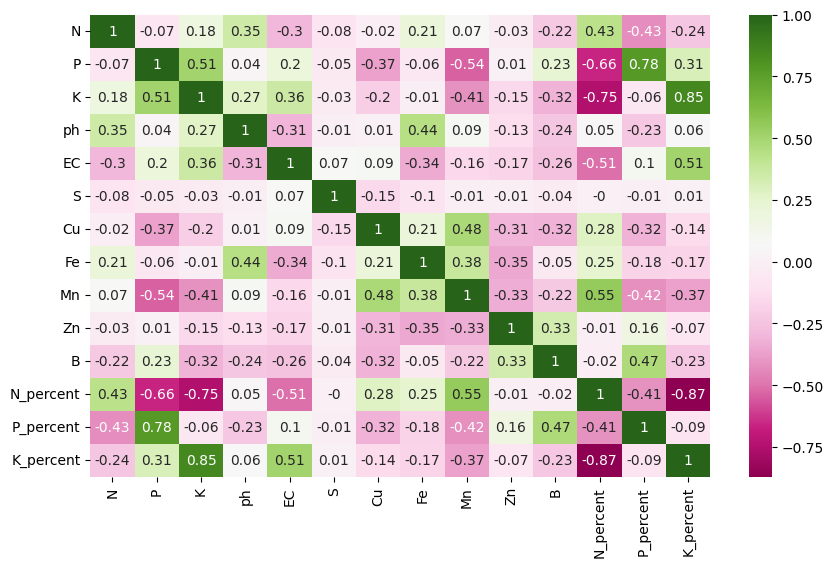

In [20]:
plt.figure(figsize=(10,6))
sns.heatmap(df.select_dtypes(include=[np.number]).corr().round(2),cmap="PiYG",annot=True)
plt.show()

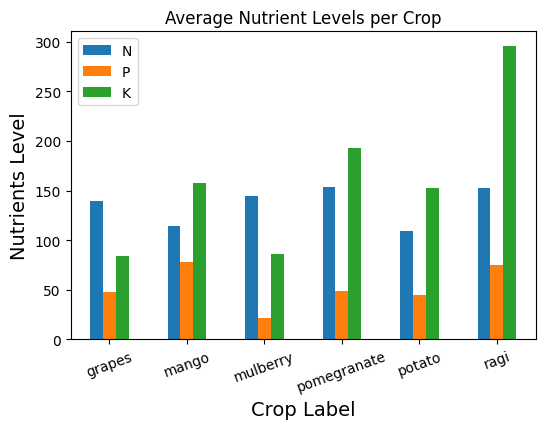

In [21]:
avg_nutrients.plot(kind='bar', figsize=(6,4))
plt.title('Average Nutrient Levels per Crop')
plt.ylabel(('Nutrients Level'),fontsize=14)
plt.xlabel(('Crop Label'),fontsize=14)
plt.xticks(rotation=20)
plt.show()

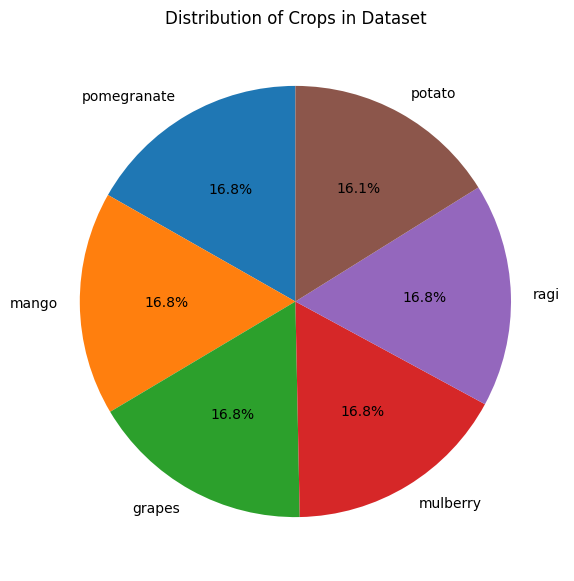

In [22]:
crop_counts = df['label'].value_counts()
plt.figure(figsize=(7,7))
plt.pie(crop_counts, labels=crop_counts.index, autopct='%1.1f%%', startangle=90)
plt.title('Distribution of Crops in Dataset')
plt.show()

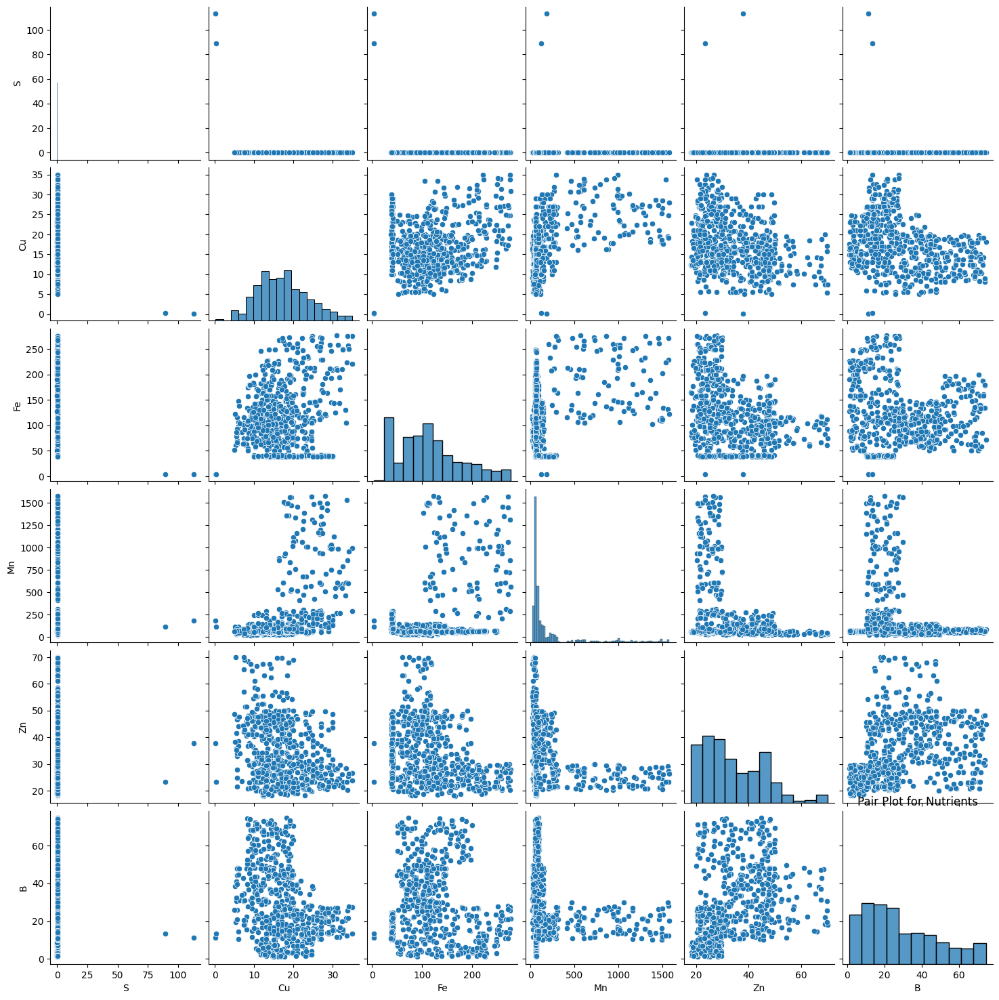

In [23]:
sns.pairplot(df[['S','Cu','Fe','Mn','Zn','B']])
plt.title('Pair Plot for Nutrients')
plt.show()

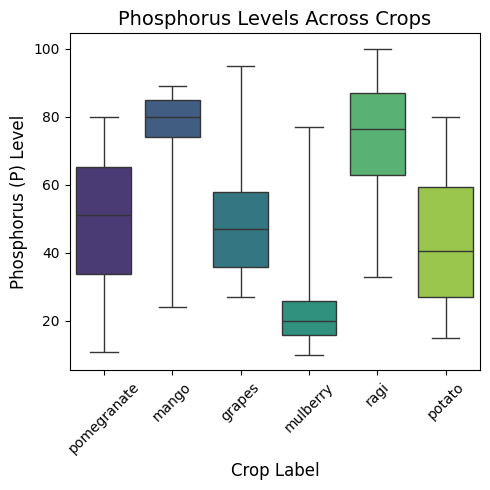

In [24]:
plt.figure(figsize=(5, 5))
sns.boxplot(x="label", y="P", data=df, palette="viridis", hue="label", whis=np.inf,legend=False)
plt.title("Phosphorus Levels Across Crops", fontsize=14)
plt.xlabel("Crop Label", fontsize=12)
plt.ylabel("Phosphorus (P) Level", fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

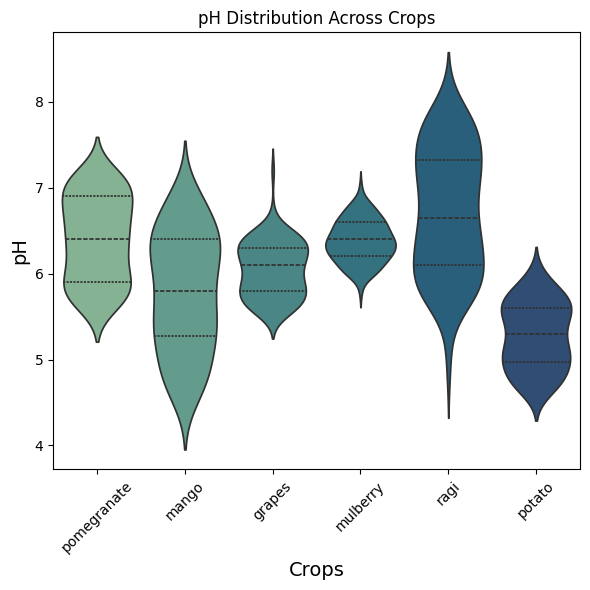

In [25]:
plt.figure(figsize=(6, 6))
sns.violinplot(x="label", y="ph", data=df, inner="quartile", palette="crest", hue="label", legend=False)
plt.title("pH Distribution Across Crops")
plt.xticks(rotation=45)
plt.xlabel("Crops", fontsize=14)
plt.ylabel("pH", fontsize=14)
plt.tight_layout()
plt.show()

In [26]:
import plotly.express as px

In [27]:
px.scatter(data_frame=df,
           x="label",
           y="N",
           animation_frame="ph",
           size="EC",
           height=600,
           color="label",
           size_max=80,
           title="N levels across crops",
          )

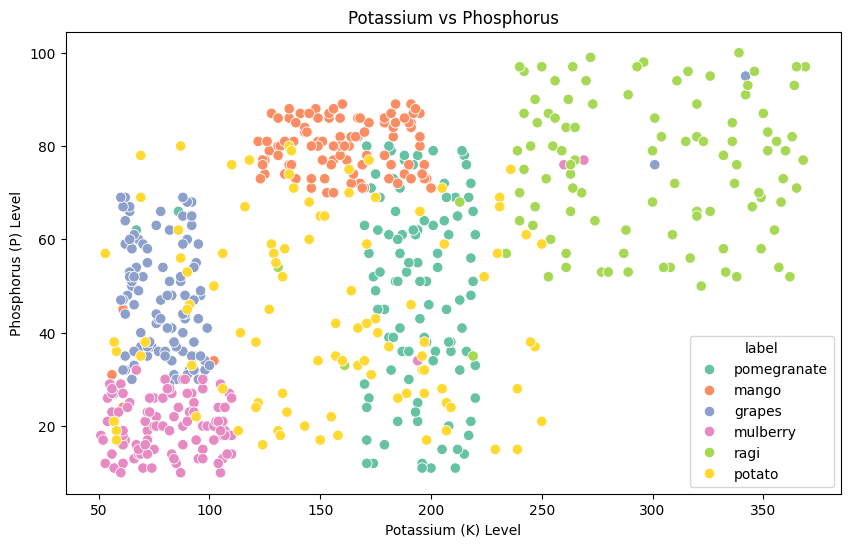

In [28]:
plt.figure(figsize=(10,6))
sns.scatterplot(x='K', y='P', hue='label', data=df, palette='Set2', s=57,marker='o')
plt.title('Potassium vs Phosphorus')
plt.xlabel('Potassium (K) Level')
plt.ylabel('Phosphorus (P) Level')
plt.show()

In [29]:
import seaborn.objects as so

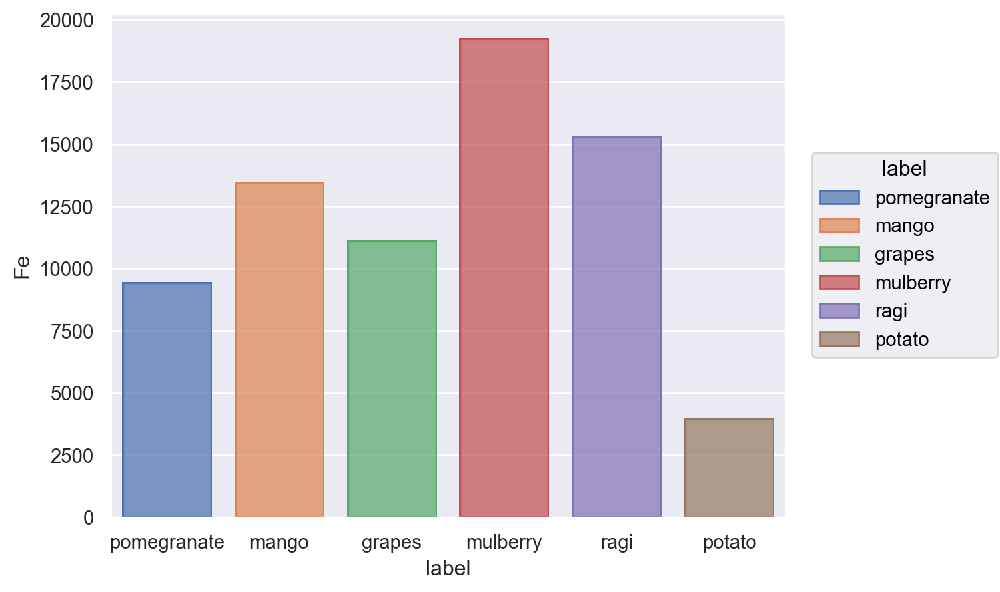

In [30]:
(
    so.Plot(data=df,
           x='label',
           y='Fe',
           color='label')
    .add(so.Bar(),so.Agg("sum"),so.Stack())
)

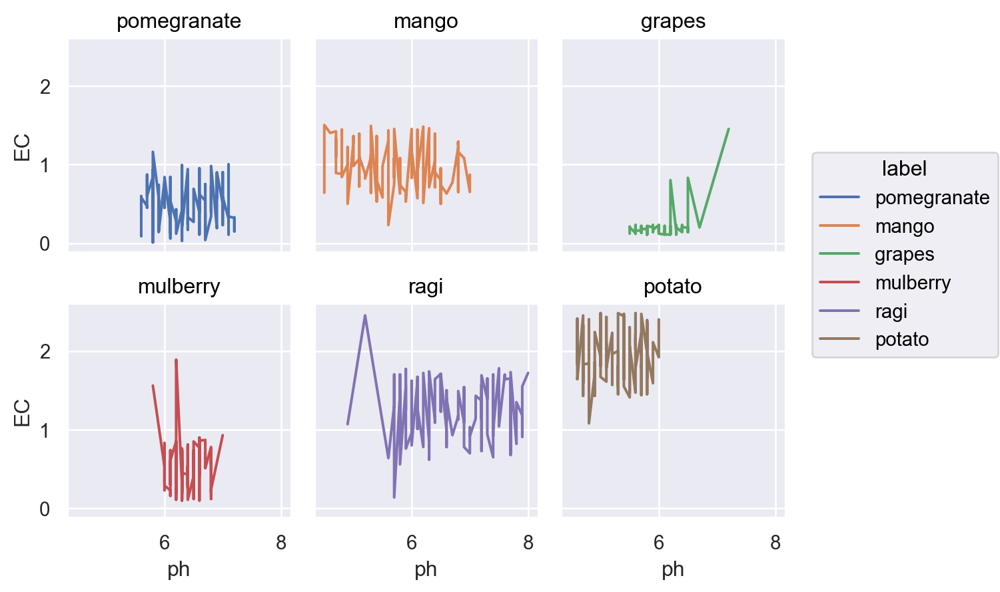

In [31]:
(
    so.Plot(df,
           x='ph',
           y='EC',
           group='label',
           color='label'
           )
    .facet(col='label',wrap=3)
    .add(so.Line())
)

# Label Encoding

In [33]:
from sklearn.preprocessing import LabelEncoder,StandardScaler
le = LabelEncoder()
df['label_encoded'] = le.fit_transform(df['label'])
print(df[['label', 'label_encoded']].head(10))

         label  label_encoded
0  pomegranate              3
1  pomegranate              3
2  pomegranate              3
3  pomegranate              3
4  pomegranate              3
5  pomegranate              3
6  pomegranate              3
7  pomegranate              3
8  pomegranate              3
9  pomegranate              3


In [208]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder

# Assuming df['label'] contains the categorical labels
le = LabelEncoder()
df['label_encoded'] = le.fit_transform(df['label'])

# Create a DataFrame to display label and corresponding encoded value
label_mapping_df = pd.DataFrame({
    'Original Label': le.classes_,
    'Encoded Value': range(len(le.classes_))
})

# Display the DataFrame
print(label_mapping_df)


  Original Label  Encoded Value
0         grapes              0
1          mango              1
2       mulberry              2
3    pomegranate              3
4         potato              4
5           ragi              5


In [34]:
# Encoded values
df.head(176)

,N,P,K,ph,EC,S,Cu,Fe,Mn,Zn,B,label,N_percent,P_percent,K_percent,label_encoded
0,143,69,217,5.9,0.58,0.23,10.20,116.35,59.96,54.85,21.29,pomegranate,33.333333,16.083916,50.582751,3
1,170,36,216,5.9,0.15,0.28,15.69,114.20,56.87,31.28,28.62,pomegranate,40.284360,8.530806,51.184834,3
2,158,66,219,6.8,0.34,0.20,15.29,65.87,51.81,57.12,27.59,pomegranate,35.665914,14.898420,49.435666,3
3,133,45,207,6.4,0.94,0.21,8.48,103.10,43.81,68.50,47.29,pomegranate,34.545455,11.688312,53.766234,3
4,132,48,218,6.7,0.54,0.19,5.59,63.40,56.40,46.71,31.04,pomegranate,33.165829,12.060302,54.773869,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
171,106,73,191,5.0,0.98,0.24,15.20,115.72,71.66,28.04,69.75,mango,28.648649,19.729730,51.621622,1
172,149,76,137,5.4,0.53,0.31,10.38,199.66,75.32,30.91,70.86,mango,41.160221,20.994475,37.845304,1
173,143,70,156,6.9,1.08,0.28,19.42,155.40,67.34,44.30,61.14,mango,38.753388,18.970190,42.276423,1
174,82,80,149,5.4,1.36,0.32,10.23,125.26,50.50,22.45,57.32,mango,26.366559,25.723473,47.909968,1


# Model Implementation 

# Logistic Regression

In [37]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix

In [38]:
X=df[['N', 'P', 'K', 'ph', 'Cu', 'Fe', 'Mn', 'Zn']]
y=df['label_encoded']

In [39]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [40]:
X_train,X_test,y_train,y_test = train_test_split(X_scaled,y,stratify=y,test_size=0.20,random_state=42)
y_train

56     3
149    1
377    2
458    5
571    4
      ..
433    5
491    5
135    1
257    0
185    1
Name: label_encoded, Length: 496, dtype: int64

In [41]:
clf=LogisticRegression(max_iter=100)

In [42]:
clf.fit(X_train,y_train)

LogisticRegression()

In [43]:
y_pred=clf.predict(X_test)
y_pred

array([3, 0, 3, 4, 4, 5, 5, 5, 5, 0, 0, 5, 2, 4, 0, 4, 3, 5, 0, 3, 0, 2,
       0, 0, 2, 5, 3, 5, 3, 0, 4, 1, 0, 2, 5, 2, 5, 4, 3, 0, 3, 5, 3, 1,
       3, 1, 5, 4, 5, 1, 2, 0, 3, 3, 3, 1, 4, 4, 2, 2, 2, 5, 0, 1, 1, 0,
       2, 1, 1, 4, 1, 4, 1, 4, 2, 3, 5, 2, 3, 2, 4, 0, 5, 2, 5, 3, 4, 2,
       4, 2, 1, 4, 0, 2, 0, 1, 0, 4, 1, 1, 3, 1, 2, 0, 1, 4, 5, 3, 4, 0,
       3, 5, 4, 5, 3, 2, 2, 5, 5, 3, 4, 0, 2, 5])

In [44]:
log = pd.DataFrame({'y_pred':y_pred,
             'y_true':y_test})
log.head(10)

,y_pred,y_true
27,3,3
260,0,0
20,3,3
528,4,4
603,4,4
444,5,5
511,5,5
452,5,5
451,5,5
271,0,0


In [45]:
accuracy = accuracy_score(y_test, y_pred)
cm = confusion_matrix(y_test, y_pred)

In [46]:
print(f"Accuracy: {accuracy}")
print(f"Confusion Matrix:\n{cm}")

Accuracy: 0.9354838709677419
Confusion Matrix:
[[20  0  1  0  0  0]
 [ 0 17  1  0  2  0]
 [ 0  0 19  0  0  2]
 [ 1  0  0 20  0  0]
 [ 0  0  0  1 19  0]
 [ 0  0  0  0  0 21]]


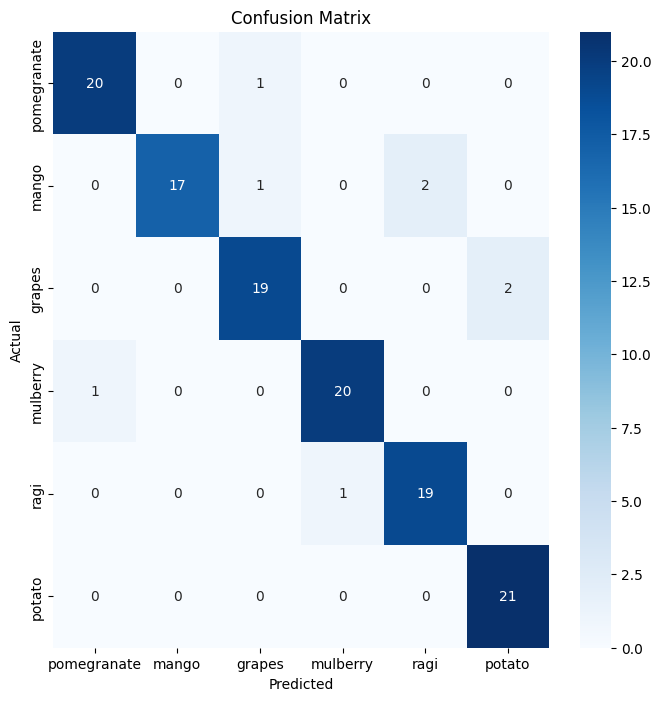

In [47]:
plt.figure(figsize=(8, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=df['label'].unique(), yticklabels=df['label'].unique())
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [48]:
from sklearn import metrics
cm1=metrics.confusion_matrix(y_test,y_pred)

In [49]:
tp=cm1[1,1]
tn=cm1[0,0]
fp=cm1[0,1]
fn=cm1[1,0]
fn

0

In [50]:
tp

17

In [51]:
tn

20

In [52]:
fp

0

In [53]:
# recall (sensitivity)
recall = tp/(tp+fn)
recall

1.0

In [54]:
precision=tp/(tp+fp)
precision

1.0

In [55]:
false_alarm_rate = fp/(fp+tn)
false_alarm_rate

0.0

In [56]:
print(metrics.classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.95      0.95      0.95        21
           1       1.00      0.85      0.92        20
           2       0.90      0.90      0.90        21
           3       0.95      0.95      0.95        21
           4       0.90      0.95      0.93        20
           5       0.91      1.00      0.95        21

    accuracy                           0.94       124
   macro avg       0.94      0.93      0.93       124
weighted avg       0.94      0.94      0.94       124



In [57]:
y_prob = clf.predict_proba(X_test)
y_prob

array([[7.92653349e-02, 1.21031735e-03, 3.04181619e-01, 5.22032161e-01,
        3.25799422e-02, 6.07306262e-02],
       [8.04202693e-01, 5.91748454e-02, 8.30673503e-04, 1.33751602e-01,
        1.21238884e-03, 8.27797480e-04],
       [5.94022365e-02, 2.76634220e-03, 2.20210067e-04, 9.29238713e-01,
        5.50115720e-04, 7.82238285e-03],
       [1.05284943e-03, 1.18766130e-03, 1.62502166e-02, 9.06225293e-03,
        9.60574489e-01, 1.18725308e-02],
       [4.34262065e-03, 1.39661362e-02, 6.14900162e-03, 4.11472693e-03,
        9.67102937e-01, 4.32457722e-03],
       [3.24887906e-05, 1.09356791e-04, 3.73354010e-04, 1.21064816e-01,
        2.50061249e-04, 8.78169923e-01],
       [2.49567778e-07, 2.63123467e-03, 5.56360861e-07, 1.40331226e-03,
        3.46288860e-06, 9.95961184e-01],
       [3.61118541e-05, 9.36322118e-03, 2.23689196e-04, 1.93926412e-02,
        9.56250912e-08, 9.70984241e-01],
       [1.33692363e-06, 7.21724216e-04, 2.18659018e-06, 1.18313533e-02,
        3.14500161e-04, 

In [58]:
# Cross fold validation
from sklearn.model_selection import KFold, cross_val_score, RepeatedKFold
lr1 = LogisticRegression(solver='liblinear', max_iter=10000, random_state=42)
cv = RepeatedKFold(n_splits=5, random_state=456, n_repeats=10)
accuracy_results = cross_val_score(lr1, X, y, cv=cv, scoring='accuracy')

In [59]:
lr1

LogisticRegression(max_iter=10000, random_state=42, solver='liblinear')

In [60]:
accuracy_results

array([0.94354839, 0.94354839, 0.91935484, 0.94354839, 0.93548387,
       0.94354839, 0.88709677, 0.96774194, 0.93548387, 0.94354839,
       0.90322581, 0.89516129, 0.95967742, 0.93548387, 0.92741935,
       0.94354839, 0.91129032, 0.90322581, 0.91935484, 0.9516129 ,
       0.88709677, 0.94354839, 0.96774194, 0.92741935, 0.92741935,
       0.94354839, 0.92741935, 0.9516129 , 0.95967742, 0.90322581,
       0.91935484, 0.91129032, 0.92741935, 0.94354839, 0.96774194,
       0.93548387, 0.91935484, 0.93548387, 0.92741935, 0.95967742,
       0.93548387, 0.94354839, 0.89516129, 0.9516129 , 0.91935484,
       0.90322581, 0.94354839, 0.92741935, 0.94354839, 0.91129032])

In [61]:
# cross fold validation
mean_accuracy = accuracy_results.mean()
std_accuracy = accuracy_results.std()

print(f"Mean Accuracy: {mean_accuracy:.4f}")
print(f"Standard Deviation of Accuracy: {std_accuracy:.4f}")

Mean Accuracy: 0.9315
Standard Deviation of Accuracy: 0.0206


In [62]:
import numpy as np
np.unique(y_train)

array([0, 1, 2, 3, 4, 5])

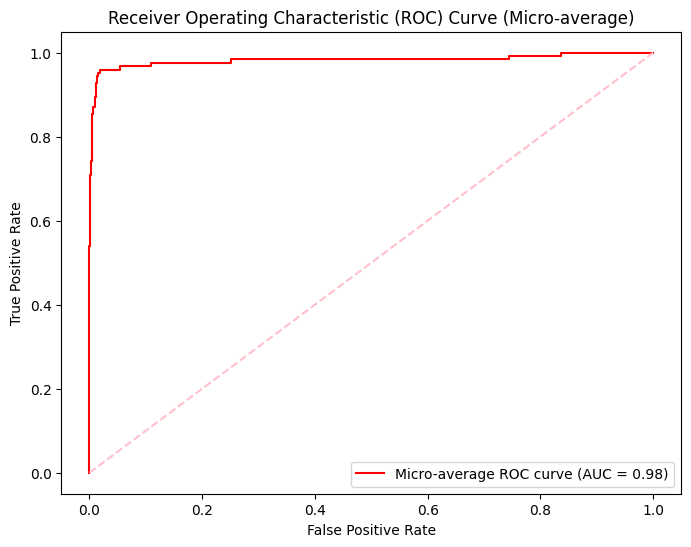

In [63]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Binarize the labels
y_test_binarized = label_binarize(y_test, classes=[0, 1, 2,3,4,5])  # Replace with your class labels

# Compute micro-average ROC curve and AUC
fpr, tpr, _ = roc_curve(y_test_binarized.ravel(), y_prob.ravel())
roc_auc = auc(fpr, tpr)

# Plot micro-average ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='red', label=f'Micro-average ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='pink', linestyle='--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver Operating Characteristic (ROC) Curve (Micro-average)")
plt.legend(loc="lower right")
plt.show()


In [64]:
y_prob[:,1]

array([1.21031735e-03, 5.91748454e-02, 2.76634220e-03, 1.18766130e-03,
       1.39661362e-02, 1.09356791e-04, 2.63123467e-03, 9.36322118e-03,
       7.21724216e-04, 7.09659506e-02, 6.02911122e-02, 3.76526760e-04,
       5.99327703e-03, 4.12759835e-01, 8.99800222e-03, 3.43075582e-03,
       2.97882550e-05, 2.06221429e-02, 1.82593532e-01, 7.46226009e-03,
       7.50581235e-02, 7.72098559e-03, 3.40938405e-03, 2.70412295e-01,
       7.72989285e-03, 6.26006822e-04, 1.52248167e-02, 1.61306832e-02,
       3.30313030e-02, 1.22916572e-02, 8.91663546e-03, 9.38950307e-01,
       2.41357609e-01, 1.92701770e-02, 6.37362333e-02, 9.22573294e-04,
       1.03432191e-01, 8.16112542e-04, 3.39715147e-03, 9.76770003e-02,
       5.23020272e-05, 4.33964789e-04, 2.21426795e-03, 9.20208523e-01,
       9.06516057e-02, 9.56385504e-01, 5.35870830e-03, 7.22096999e-03,
       2.84694902e-03, 9.49665347e-01, 1.93191228e-03, 5.58385850e-03,
       2.20120516e-03, 1.70013999e-02, 6.88595473e-02, 9.95504610e-01,
      

# Ridge and Lasso Regression

In [66]:
from sklearn.metrics import classification_report

# Apply L1 and L2 regularization to Logistic Regression
from sklearn.linear_model import LogisticRegression

log_reg_l1 = LogisticRegression(penalty='l1', solver='saga', max_iter=1000)
log_reg_l2 = LogisticRegression(penalty='l2', solver='lbfgs', max_iter=1000)

# Fit and evaluate the models with cross-validation or test data
log_reg_l1.fit(X_train, y_train)
log_reg_l2.fit(X_train, y_train)

print("Logistic Regression with L1 Regularization:")
print(classification_report(y_test, log_reg_l1.predict(X_test)))

print("Logistic Regression with L2 Regularization:")
print(classification_report(y_test, log_reg_l2.predict(X_test)))
    

Logistic Regression with L1 Regularization:
              precision    recall  f1-score   support

           0       0.95      0.95      0.95        21
           1       1.00      0.90      0.95        20
           2       0.90      0.90      0.90        21
           3       1.00      0.95      0.98        21
           4       0.95      1.00      0.98        20
           5       0.91      1.00      0.95        21

    accuracy                           0.95       124
   macro avg       0.95      0.95      0.95       124
weighted avg       0.95      0.95      0.95       124

Logistic Regression with L2 Regularization:
              precision    recall  f1-score   support

           0       0.95      0.95      0.95        21
           1       1.00      0.85      0.92        20
           2       0.90      0.90      0.90        21
           3       0.95      0.95      0.95        21
           4       0.90      0.95      0.93        20
           5       0.91      1.00      0.95 

## SMOTE (Synthetic Minority Oversampling Technique)

In [67]:
# Handle class imbalance using SMOTE
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

print("After applying SMOTE:")
print(f"Class distribution: {dict(zip(*np.unique(y_resampled, return_counts=True)))}")
    

After applying SMOTE:
Class distribution: {0: 84, 1: 84, 2: 84, 3: 84, 4: 84, 5: 84}


In [68]:

# Dimensionality reduction using PCA
from sklearn.decomposition import PCA

pca = PCA(n_components=0.95)  # Retain 95% of variance
X_pca = pca.fit_transform(X_train)

print(f"Original feature dimensions: {X_train.shape[1]}, Reduced dimensions: {X_pca.shape[1]}")
    

Original feature dimensions: 8, Reduced dimensions: 7


# Other Classifications and Ensembing Technique

In [70]:
# Adding new classifiers and evaluating
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC

# Initialize classifiers
rf_clf = RandomForestClassifier(random_state=42)
dt_clf = DecisionTreeClassifier(random_state=42)
svm_clf = SVC(probability=True, random_state=42)

# Fit and evaluate each classifier
for clf, name in [(rf_clf, "Random Forest"), (dt_clf, "Decision Tree"), (svm_clf, "SVM"),(log_reg_l1,"Logistic Regression(L1)")]:
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    print(f"{name} Classifier:")
    print(classification_report(y_test, y_pred))
    

Random Forest Classifier:
              precision    recall  f1-score   support

           0       0.95      0.95      0.95        21
           1       1.00      0.95      0.97        20
           2       0.90      0.90      0.90        21
           3       1.00      0.95      0.98        21
           4       1.00      1.00      1.00        20
           5       0.91      1.00      0.95        21

    accuracy                           0.96       124
   macro avg       0.96      0.96      0.96       124
weighted avg       0.96      0.96      0.96       124

Decision Tree Classifier:
              precision    recall  f1-score   support

           0       0.91      0.95      0.93        21
           1       0.95      0.95      0.95        20
           2       0.89      0.81      0.85        21
           3       1.00      0.95      0.98        21
           4       1.00      1.00      1.00        20
           5       0.91      1.00      0.95        21

    accuracy             

In [71]:
classifiers = [rf_clf, dt_clf, svm_clf, log_reg_l1]
classifier_names = ["Random Forest", "Decision Tree", "SVM", "Logistic Regression (L1)"]

# Create a table of metrics for better comparison
metrics = {}

for clf, name in zip(classifiers, classifier_names):
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    report = classification_report(y_test, y_pred, output_dict=True)
    
    # Store relevant metrics
    metrics[name] = {
        'Accuracy': round(report['accuracy'], 2),
        'Precision (Macro)': round(report['macro avg']['precision'], 2),
        'Recall (Macro)': round(report['macro avg']['recall'], 2),
        'F1-Score (Macro)': round(report['macro avg']['f1-score'], 2)
    }

# Convert the metrics dictionary into a DataFrame for easier presentation
metrics_df = pd.DataFrame(metrics).T

# Apply custom styling with new coloring
def style_metrics_df(df):
    # Style the DataFrame for better readability with new color choices
    return df.style.format("{:.2f}") \
        .highlight_max(axis=0, color='lightblue', subset=['Accuracy', 'Precision (Macro)', 'Recall (Macro)', 'F1-Score (Macro)']) \
        .highlight_min(axis=0, color='lightpink', subset=['Accuracy', 'Precision (Macro)', 'Recall (Macro)', 'F1-Score (Macro)']) \
        .set_caption("Comparison of Classifiers Based on Key Metrics") \
        .set_table_styles(
            [{'selector': 'thead th', 'props': [('background-color', '#f0f0f0'), ('font-weight', 'bold'), ('font-size', '14px')]},
             {'selector': 'tbody td', 'props': [('font-size', '12px')]},
             {'selector': 'caption', 'props': [('caption-side', 'top'), ('font-size', '16px'), ('font-weight', 'bold')]}])

# Display the styled DataFrame
styled_df = style_metrics_df(metrics_df)
styled_df


,Accuracy,Precision (Macro),Recall (Macro),F1-Score (Macro)
Random Forest,0.96,0.96,0.96,0.96
Decision Tree,0.94,0.94,0.94,0.94
SVM,0.96,0.96,0.96,0.96
Logistic Regression (L1),0.95,0.95,0.95,0.95


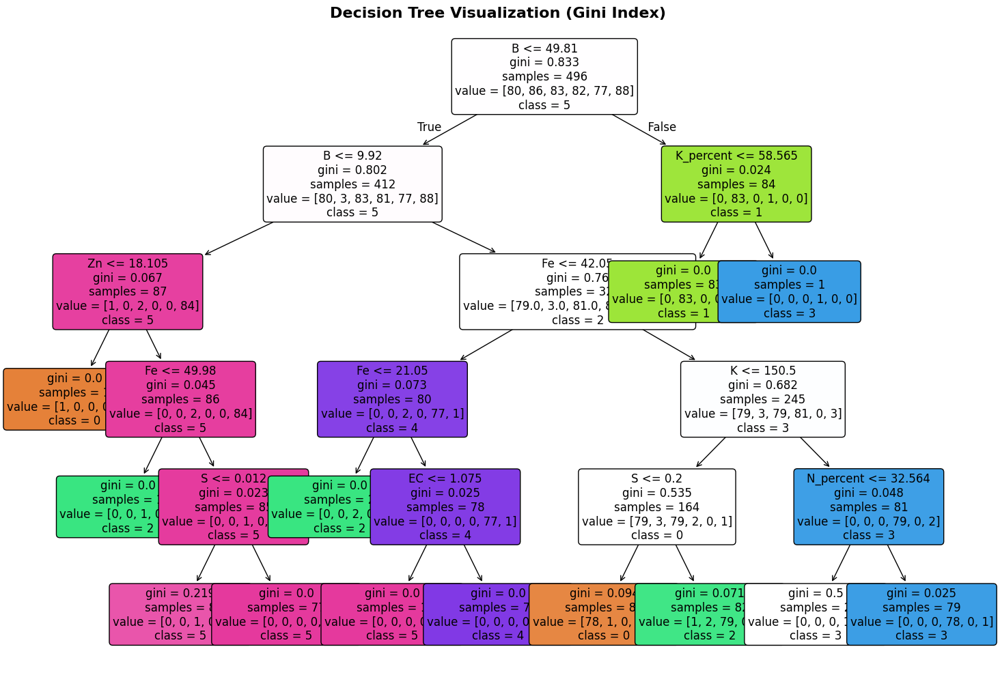

In [72]:
from sklearn.tree import DecisionTreeClassifier, plot_tree

# Drop the label column from the features
X = df.drop(['label', 'label_encoded'], axis=1)  # Features (all columns except the label)
y = df['label_encoded']  # Target column

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a DecisionTreeClassifier with Gini index as the criterion
dt_clf = DecisionTreeClassifier(criterion='gini', random_state=42, max_depth=5)

# Fit the model
dt_clf.fit(X_train, y_train)

# Plot the Decision Tree using the tree.plot_tree function
plt.figure(figsize=(15, 10))
plot_tree(dt_clf, 
          feature_names=X.columns,  # Feature names from DataFrame
          class_names=[str(cls) for cls in dt_clf.classes_],  # Class names based on unique labels
          filled=True, 
          rounded=True, 
          fontsize=12)

# Add title and show the plot
plt.title('Decision Tree Visualization (Gini Index)', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()


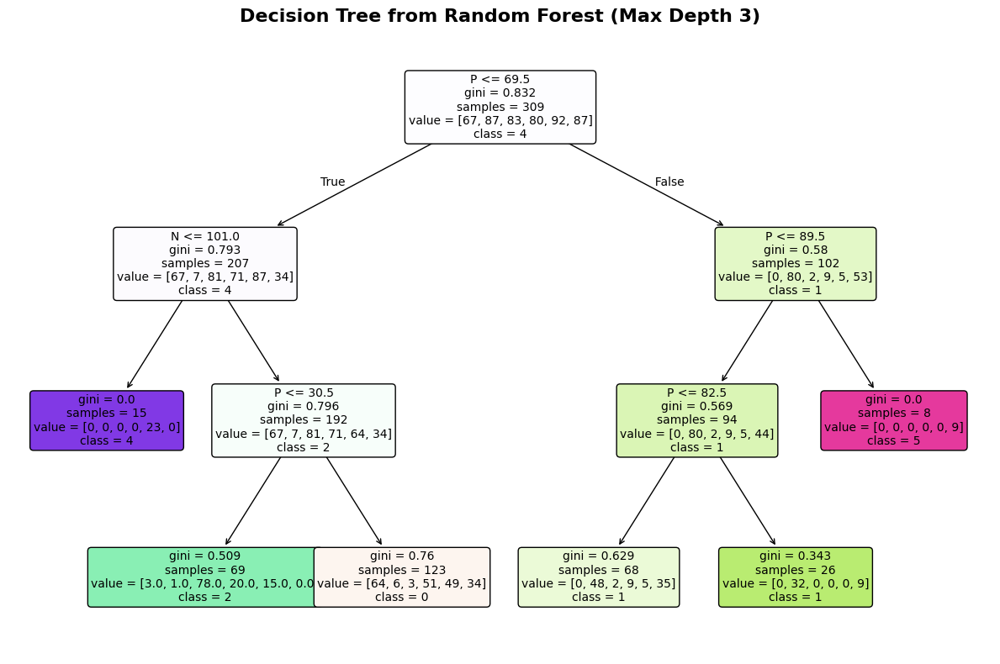

In [73]:

# Select two features for visualization (e.g., 'N' and 'P')
X = df[['N', 'P']]  # Choose two features
y = df['label_encoded']  # Target variable

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a RandomForestClassifier with fewer trees
rf_clf = RandomForestClassifier(n_estimators=3, random_state=42, max_depth=3)  # 3 trees, depth of 3

# Fit the model
rf_clf.fit(X_train, y_train)

# Plotting the first tree from the Random Forest
plt.figure(figsize=(12, 8))  # Increase figure size for better clarity
plot_tree(rf_clf.estimators_[0],  # Plot the first tree
          feature_names=X.columns,  # Use the feature names
          class_names=[str(cls) for cls in rf_clf.classes_],  # Class names
          filled=True, 
          rounded=True, 
          fontsize=10,
          max_depth=3)  # Limit depth to 3 levels for simplicity

# Add title and show the plot
plt.title('Decision Tree from Random Forest (Max Depth 3)', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()


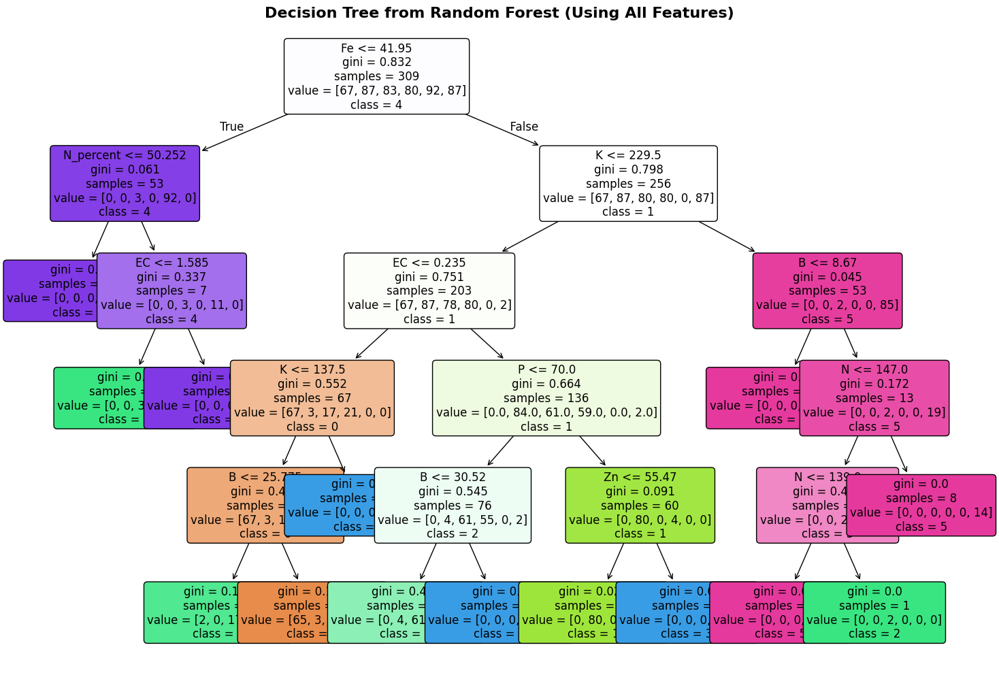

In [74]:

X = df.drop(['label', 'label_encoded'], axis=1)  # Features (all columns except the label)
y = df['label_encoded']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a RandomForestClassifier with fewer trees and limited depth
rf_clf = RandomForestClassifier(n_estimators=3, random_state=42, max_depth=5)  # 3 trees, depth of 5

# Fit the model
rf_clf.fit(X_train, y_train)

# Plotting the first tree from the Random Forest
plt.figure(figsize=(15, 10))  # Increase figure size for better clarity
plot_tree(rf_clf.estimators_[0],  # Plot the first tree
          feature_names=X.columns,  # Use the feature names from the dataset
          class_names=[str(cls) for cls in rf_clf.classes_],  # Class names
          filled=True, 
          rounded=True, 
          fontsize=12)

# Add title and show the plot
plt.title('Decision Tree from Random Forest (Using All Features)', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but SVC was fitted with feature names



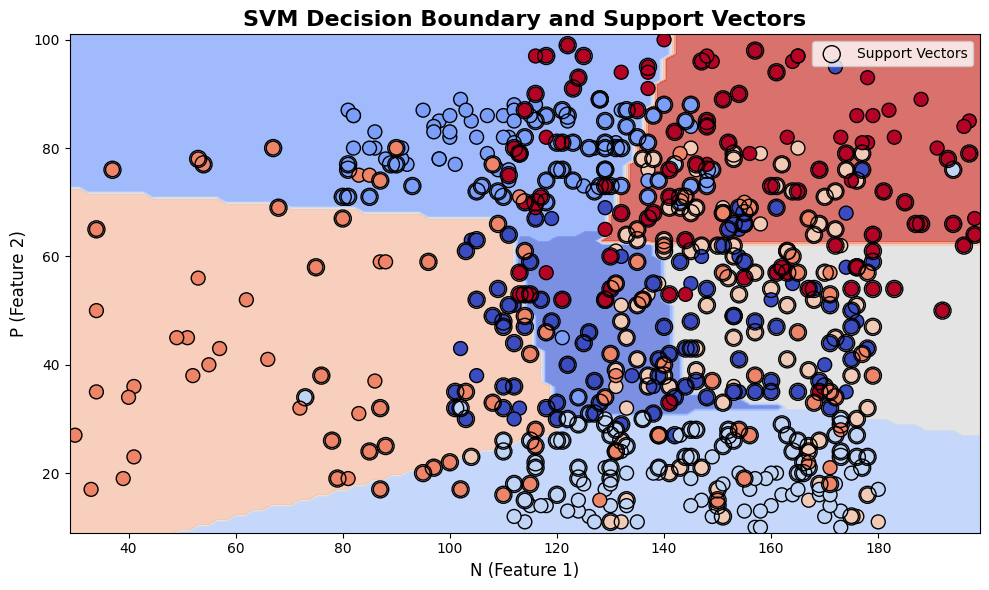

In [75]:
# Select two features for visualization (e.g., 'N' and 'P')
X = df[['N', 'P']]  # Choose two features
y = df['label_encoded']  # Target variable

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train an SVM classifier
svm_clf = SVC(kernel='linear', random_state=42)
svm_clf.fit(X_train, y_train)

# Plot the decision boundary
plt.figure(figsize=(10, 6))

# Define the decision boundary
x_min, x_max = X['N'].min() - 1, X['N'].max() + 1
y_min, y_max = X['P'].min() - 1, X['P'].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))

# Predict on the grid
Z = svm_clf.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Plot decision boundary and margins
plt.contourf(xx, yy, Z, alpha=0.75, cmap='coolwarm')
plt.scatter(X['N'], X['P'], c=y, edgecolors='k', marker='o', s=100, cmap='coolwarm')
plt.scatter(svm_clf.support_vectors_[:, 0], svm_clf.support_vectors_[:, 1], facecolors='none', edgecolors='black', s=150, label='Support Vectors')

# Add labels and title
plt.title('SVM Decision Boundary and Support Vectors', fontsize=16, fontweight='bold')
plt.xlabel('N (Feature 1)', fontsize=12)
plt.ylabel('P (Feature 2)', fontsize=12)
plt.legend()
plt.tight_layout()

plt.show()


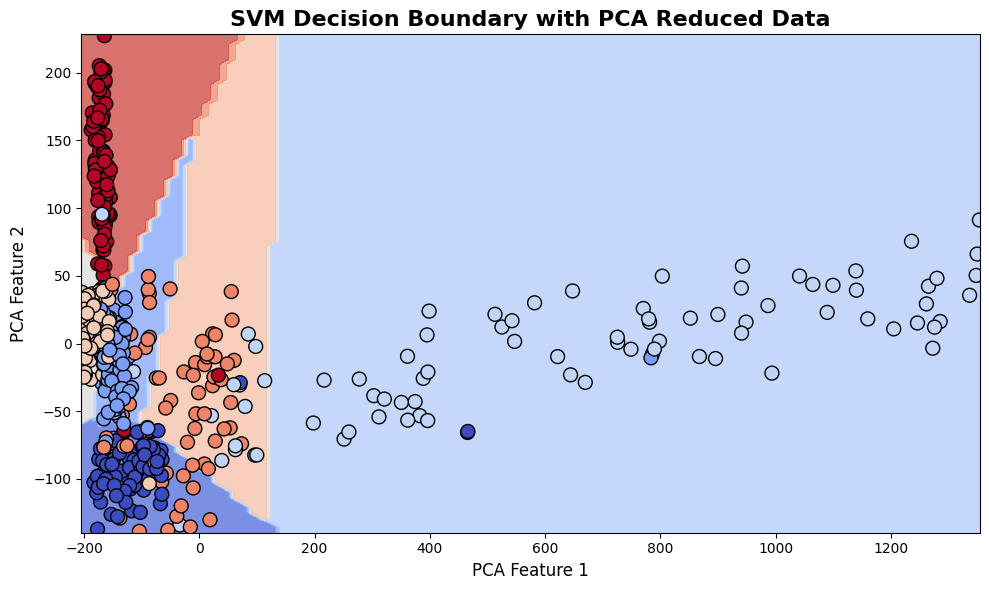

In [76]:
X = df.drop(['label', 'label_encoded'], axis=1)  # Features (all columns except the label)
y = df['label_encoded']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Use PCA to reduce to 2D
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_train)

# Train an SVM classifier on the PCA-reduced data
svm_clf = SVC(kernel='linear', random_state=42)
svm_clf.fit(X_pca, y_train)

# Plot the decision boundary in 2D
plt.figure(figsize=(10, 6))

# Define the decision boundary
x_min, x_max = X_pca[:, 0].min() - 1, X_pca[:, 0].max() + 1
y_min, y_max = X_pca[:, 1].min() - 1, X_pca[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))

# Predict on the grid
Z = svm_clf.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Plot decision boundary and margins
plt.contourf(xx, yy, Z, alpha=0.75, cmap='coolwarm')
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_train, edgecolors='k', marker='o', s=100, cmap='coolwarm')
plt.title('SVM Decision Boundary with PCA Reduced Data', fontsize=16, fontweight='bold')
plt.xlabel('PCA Feature 1', fontsize=12)
plt.ylabel('PCA Feature 2', fontsize=12)
plt.tight_layout()
plt.show()


/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



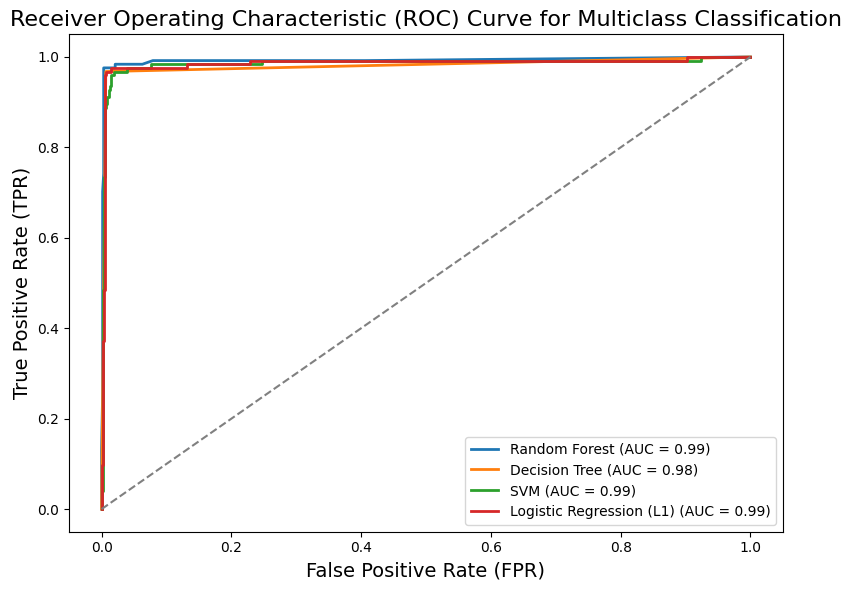

In [77]:
# Initialize classifiers
rf_clf = RandomForestClassifier(random_state=42)
dt_clf = DecisionTreeClassifier(random_state=42)
svm_clf = SVC(probability=True, random_state=42)
log_reg_l1 = LogisticRegression(penalty='l1', solver='saga', max_iter=1000)

# Fit and evaluate each classifier
classifiers = [rf_clf, dt_clf, svm_clf, log_reg_l1]
classifier_names = ["Random Forest", "Decision Tree", "SVM", "Logistic Regression (L1)"]

# Binarize the output for multiclass (One-vs-Rest)
y_test_bin = label_binarize(y_test, classes=np.unique(y_test))

# Plot ROC curve for each classifier
plt.figure(figsize=(8, 6))

# Loop through each classifier
for clf, name in zip(classifiers, classifier_names):
    # Fit the classifier
    clf.fit(X_train, y_train)
    
    # Get predicted probabilities for ROC curve
    if hasattr(clf, 'predict_proba'):
        y_probs = clf.predict_proba(X_test)
    else:  # For SVM, use decision function and apply softmax
        y_probs = clf.decision_function(X_test)
    
    # Compute ROC curve for micro-average
    fpr, tpr, _ = roc_curve(y_test_bin.ravel(), y_probs.ravel())
    roc_auc = auc(fpr, tpr)
    
    # Plot ROC curve for the classifier
    plt.plot(fpr, tpr, lw=2, label=f'{name} (AUC = {roc_auc:.2f})')

# Plot the diagonal (random classifier)
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')

# Customize the plot
plt.title('Receiver Operating Characteristic (ROC) Curve for Multiclass Classification', fontsize=16)
plt.xlabel('False Positive Rate (FPR)', fontsize=14)
plt.ylabel('True Positive Rate (TPR)', fontsize=14)
plt.legend(loc='lower right')

# Show the plot
plt.tight_layout()
plt.show()


/var/folders/b6/l8w02y4978b6wv7sdk_8f4b80000gn/T/ipykernel_5028/205454018.py:13: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




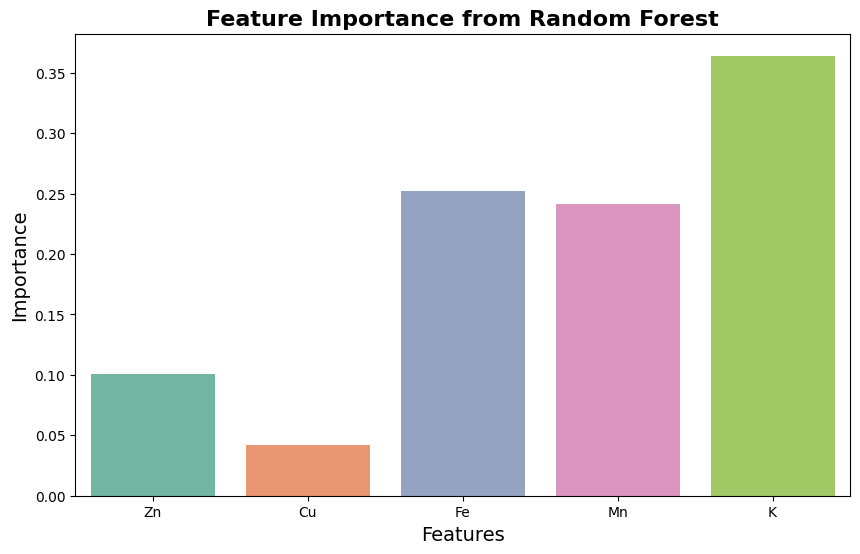

In [78]:
from sklearn.ensemble import RandomForestClassifier

# Train Random Forest model to get feature importance
rf_clf = RandomForestClassifier(n_estimators=10, random_state=42)
rf_clf.fit(df[['Zn', 'Cu', 'Fe', 'Mn', 'K']], df['label_encoded'])

# Get feature importances
importances = rf_clf.feature_importances_
features = df[['Zn', 'Cu', 'Fe', 'Mn', 'K']].columns

# Plot feature importance
plt.figure(figsize=(10, 6))
sns.barplot(x=features, y=importances, palette='Set2')
plt.title('Feature Importance from Random Forest', fontsize=16, fontweight='bold')
plt.xlabel('Features', fontsize=14)
plt.ylabel('Importance', fontsize=14)
plt.show()

# Model analysis Visualizations

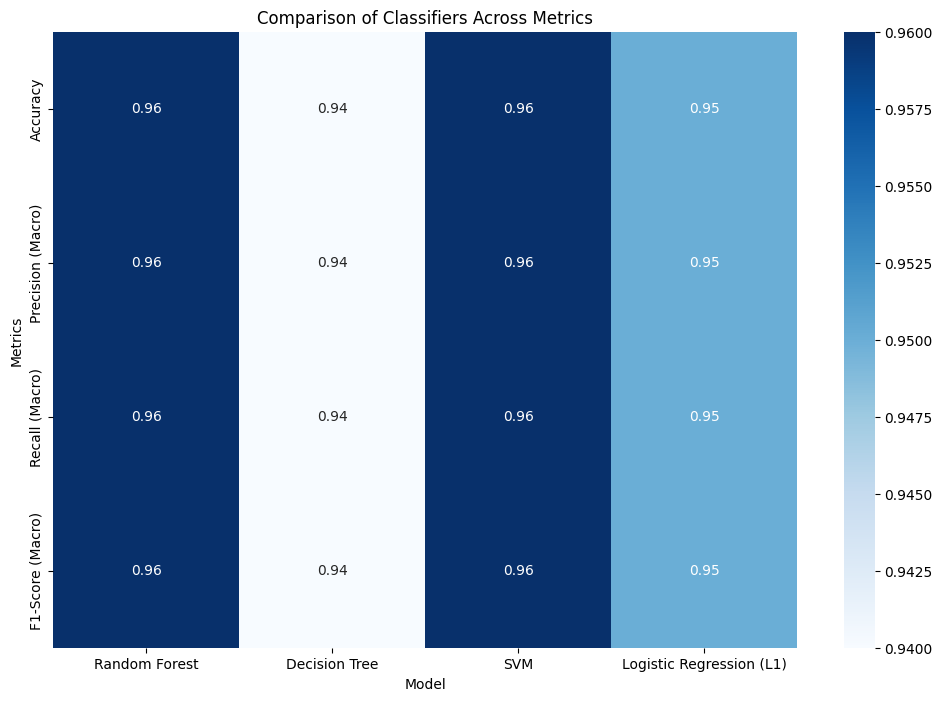

In [80]:
# 2. Heatmap for All Metrics (Accuracy, Precision, Recall, F1-Score)
plt.figure(figsize=(12, 8))
sns.heatmap(metrics_df.T, annot=True, cmap='Blues', fmt='.2f', cbar=True)
plt.title('Comparison of Classifiers Across Metrics')
plt.xlabel('Model')
plt.ylabel('Metrics')
plt.show()

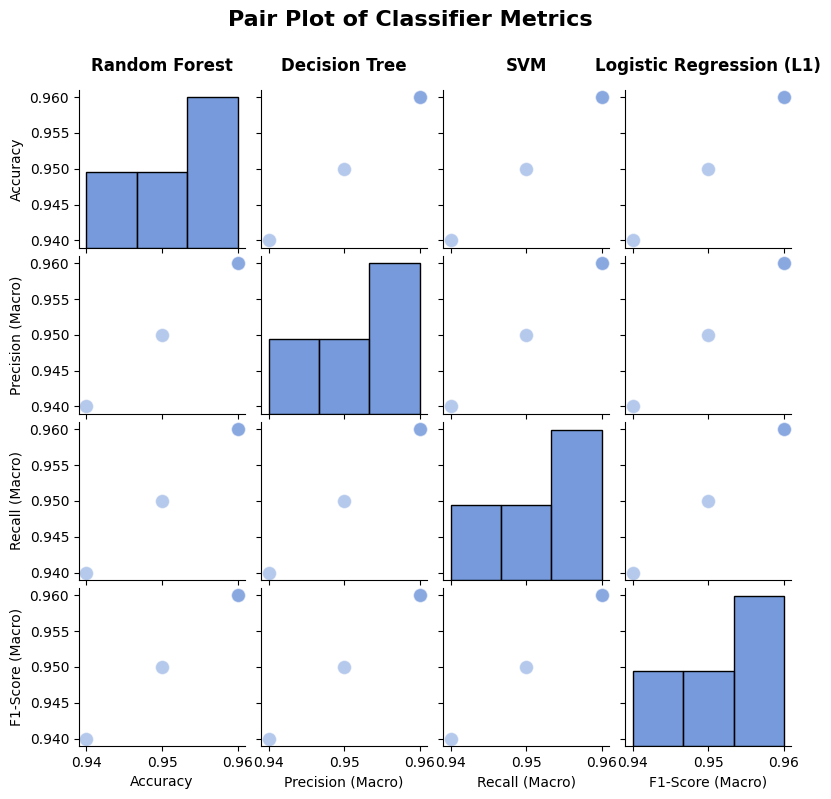

In [81]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'metrics_df' is already defined

# Set a nice color palette and style
sns.set_palette("muted")  # You can adjust this color palette to your preference

# Create the pairplot with reduced transparency (alpha) and marker size (s)
pairplot = sns.pairplot(metrics_df, plot_kws={'alpha': 0.4, 's': 100})  # Adjust marker transparency and size

# Adjust figure size for a more compact look
plt.gcf().set_size_inches(8, 8)

# Add the title and center it using suptitle
plt.suptitle('Pair Plot of Classifier Metrics', fontsize=16, fontweight='bold', ha='center')

# Adjust the spacing to avoid title overlap
plt.subplots_adjust(top=0.88)  # Reduced top margin for more space between title and plot

# Add model names for each column manually with a gap between the title and model names
for i, ax in enumerate(pairplot.axes[0, :]):  # Loop through the top row axes (i.e., the first row)
    model_name = metrics_df.index[i]  # Get the model name for the current column
    ax.text(0.5, 1.15, model_name, fontsize=12, ha='center', va='center', transform=ax.transAxes, fontweight='bold')

# Show the plot
plt.show()


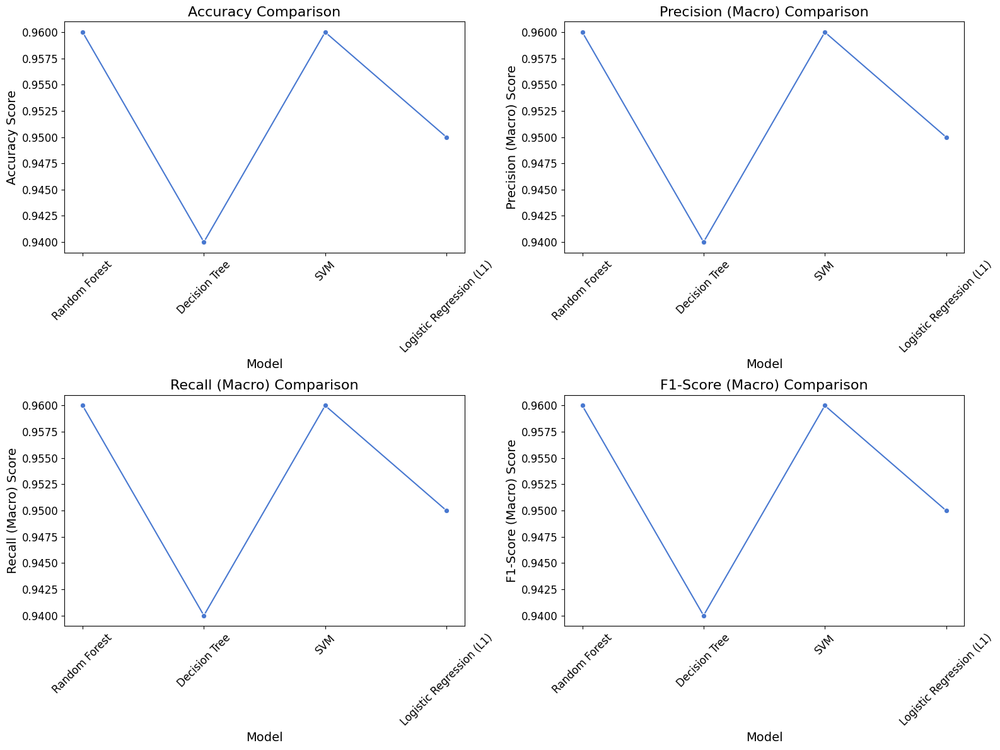

In [82]:
# Define the models and metrics
metrics = ['Accuracy', 'Precision (Macro)', 'Recall (Macro)', 'F1-Score (Macro)']
models = metrics_df.index  # Get the model names from the index of metrics_df

# Create a larger figure for better readability
plt.figure(figsize=(16, 12))  # Adjust figure size to make it bigger

# Loop over each metric and create a subplot
for i, metric in enumerate(metrics):
    plt.subplot(2, 2, i + 1)  # 2x2 grid for 4 subplots
    sns.lineplot(x=models, y=metrics_df[metric], marker='o')  # Plot each metric
    plt.title(f'{metric} Comparison', fontsize=16)  # Increase title font size
    plt.xlabel('Model', fontsize=14)  # Increase label font size
    plt.ylabel(f'{metric} Score', fontsize=14)  # Increase label font size
    plt.xticks(rotation=45, fontsize=12)  # Rotate x-axis labels and increase font size
    plt.yticks(fontsize=12)  # Increase font size for y-axis labels

# Adjust the layout to ensure proper spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()


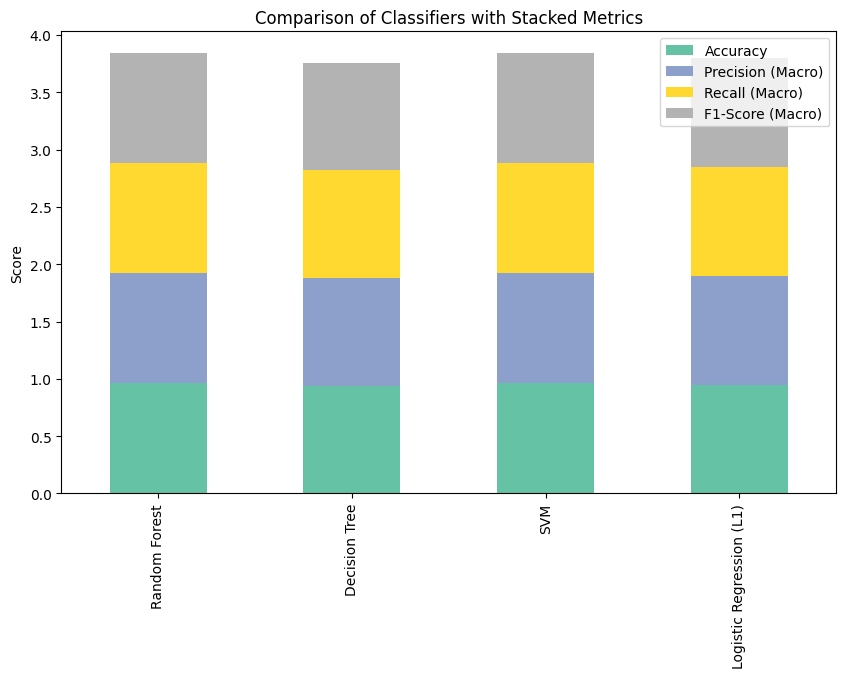

In [83]:
metrics_df.plot(kind='bar', stacked=True, figsize=(10, 6), colormap='Set2')
plt.title('Comparison of Classifiers with Stacked Metrics')
plt.ylabel('Score')
plt.show()


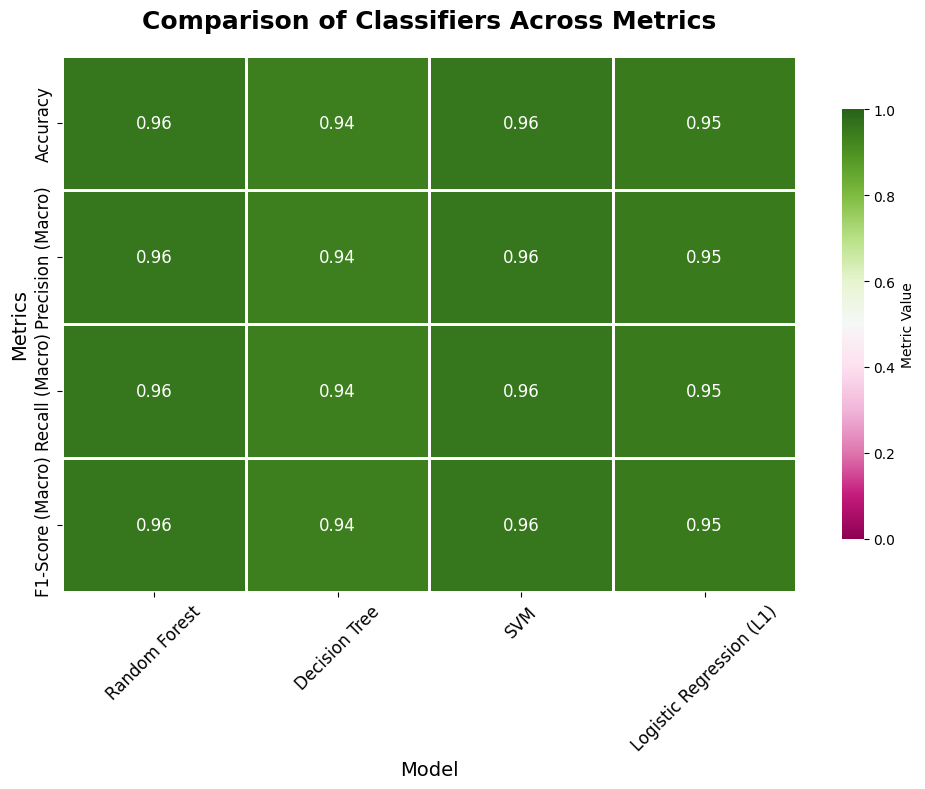

In [84]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a larger figure for better readability
plt.figure(figsize=(10, 8))  # Increase the size of the figure

# Create the heatmap with dynamic color based on values
sns.heatmap(metrics_df.T, annot=True, fmt='.2f', cmap='PiYG', cbar=True, linewidths=1, linecolor='white',
            cbar_kws={'shrink': 0.8, 'label': 'Metric Value'}, annot_kws={"size": 12}, center=0.5,
            vmin=0, vmax=1)  # Adjust the color scale to range from 0 to 1 (for performance metrics like accuracy)

# Customize the title and labels for better visibility
plt.title('Comparison of Classifiers Across Metrics', fontsize=18, fontweight='bold', pad=20)
plt.xlabel('Model', fontsize=14)
plt.ylabel('Metrics', fontsize=14)

# Adjust font size for annotations and axis labels for readability
plt.xticks(fontsize=12, rotation=45)  # Rotate x-axis labels for better readability
plt.yticks(fontsize=12)

# Show the plot with tight layout to prevent overlap
plt.tight_layout()
plt.show()


/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



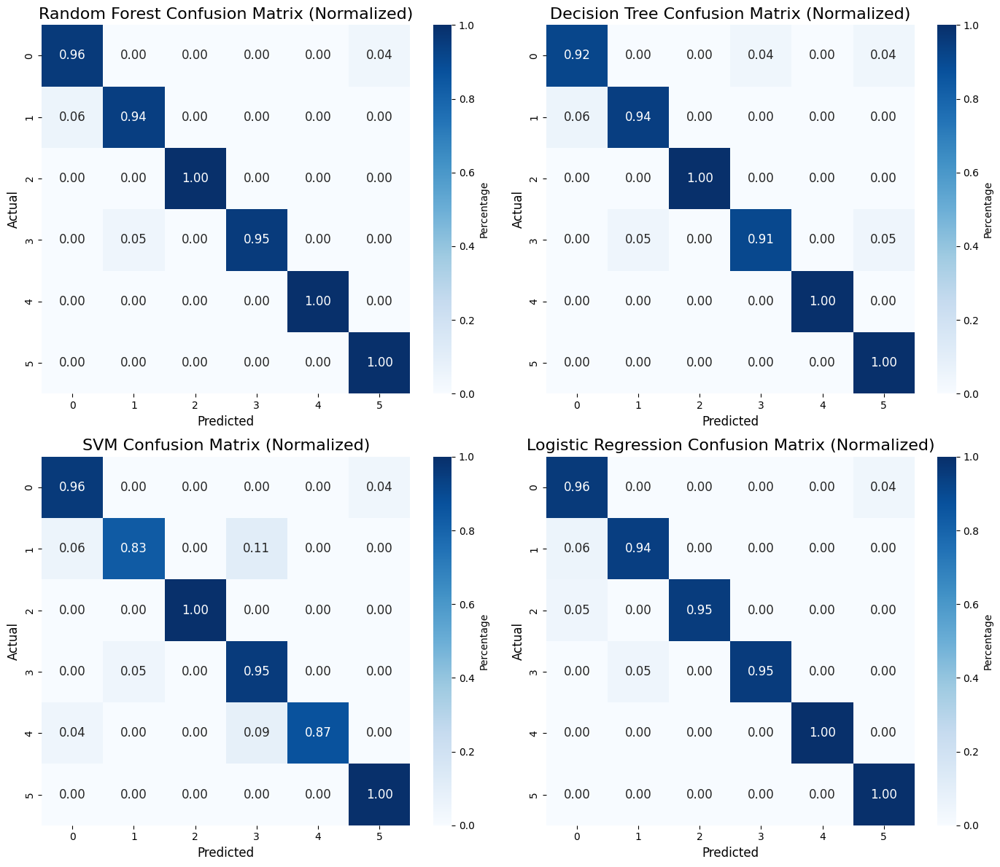

In [85]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
import numpy as np

# Example classifiers
classifiers = [
    ("Random Forest", RandomForestClassifier()),
    ("Decision Tree", DecisionTreeClassifier()),
    ("SVM", SVC(probability=True)),
    ("Logistic Regression", LogisticRegression())
]

# Train and evaluate each classifier
fig, axes = plt.subplots(2, 2, figsize=(14, 12))  # 2x2 grid for 4 classifiers
axes = axes.ravel()  # Flatten the 2x2 grid for easier iteration

for i, (name, clf) in enumerate(classifiers):
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    
    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    
    # Normalize the confusion matrix for better visualization
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    
    # Plot the confusion matrix as a heatmap
    sns.heatmap(cm_norm, annot=True, fmt='.2f', cmap='Blues', ax=axes[i],
                xticklabels=np.unique(y_test), yticklabels=np.unique(y_test),
                cbar=True, annot_kws={"size": 12}, cbar_kws={'label': 'Percentage'})
    
    # Set the title
    axes[i].set_title(f'{name} Confusion Matrix (Normalized)', fontsize=16)
    axes[i].set_xlabel('Predicted', fontsize=12)
    axes[i].set_ylabel('Actual', fontsize=12)

# Adjust the layout
plt.tight_layout()
plt.show()


/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



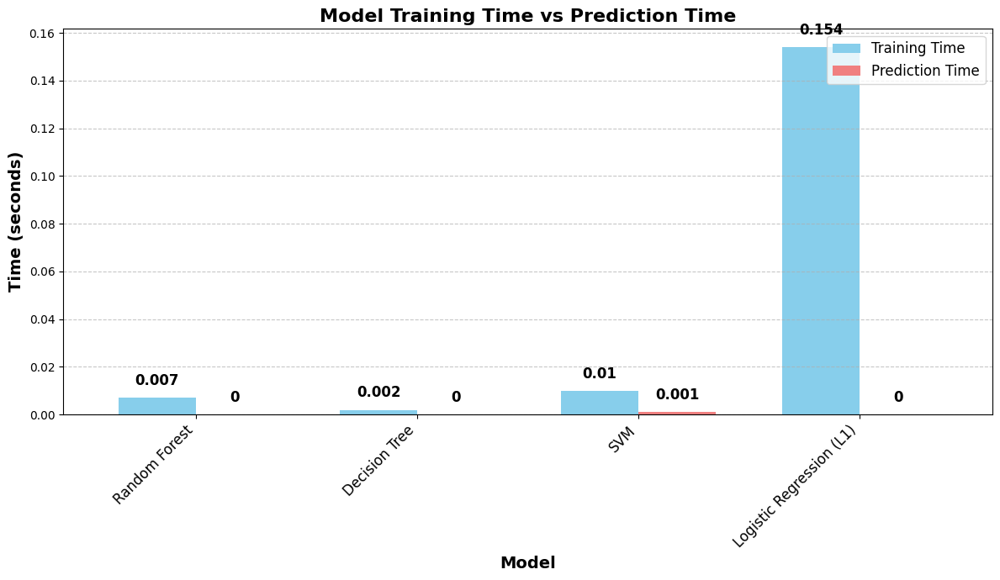

In [86]:
import time
# Create a list of classifiers with their names
classifiers = [
    (rf_clf, "Random Forest"),
    (dt_clf, "Decision Tree"),
    (svm_clf, "SVM"),
    (log_reg_l1, "Logistic Regression (L1)")
]

# Initialize dictionary to store times
times = {}

# Train and evaluate each classifier
for clf, name in classifiers:
    # Measure training time
    start_train = time.time()
    clf.fit(X_train, y_train)
    train_time = time.time() - start_train
    
    # Measure prediction time
    start_predict = time.time()
    clf.predict(X_test)
    predict_time = time.time() - start_predict
    
    # Store times
    times[name] = {
        'Training Time (s)': round(train_time, 3),
        'Prediction Time (s)': round(predict_time, 3)
    }

# Convert times into a DataFrame
times_df = pd.DataFrame(times).T

# Plotting the times
fig, ax = plt.subplots(figsize=(12, 7))  # Increased figure size for better clarity
times_df.plot(kind='bar', ax=ax, color=['skyblue', 'lightcoral'], width=0.7)

# Adding value labels on top of each bar
for container in ax.containers:
    ax.bar_label(container, fontsize=12, color='black', padding=8, fontweight='bold')

# Adding labels and title
ax.set_xlabel('Model', fontsize=14, fontweight='bold')
ax.set_ylabel('Time (seconds)', fontsize=14, fontweight='bold')
ax.set_title('Model Training Time vs Prediction Time', fontsize=16, fontweight='bold')
ax.set_xticklabels(times_df.index, rotation=45, ha='right', fontsize=12)
ax.legend(["Training Time", "Prediction Time"], loc="upper right", fontsize=12)

# Adding gridlines for better readability
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Adjusting the layout
plt.tight_layout()
plt.show()


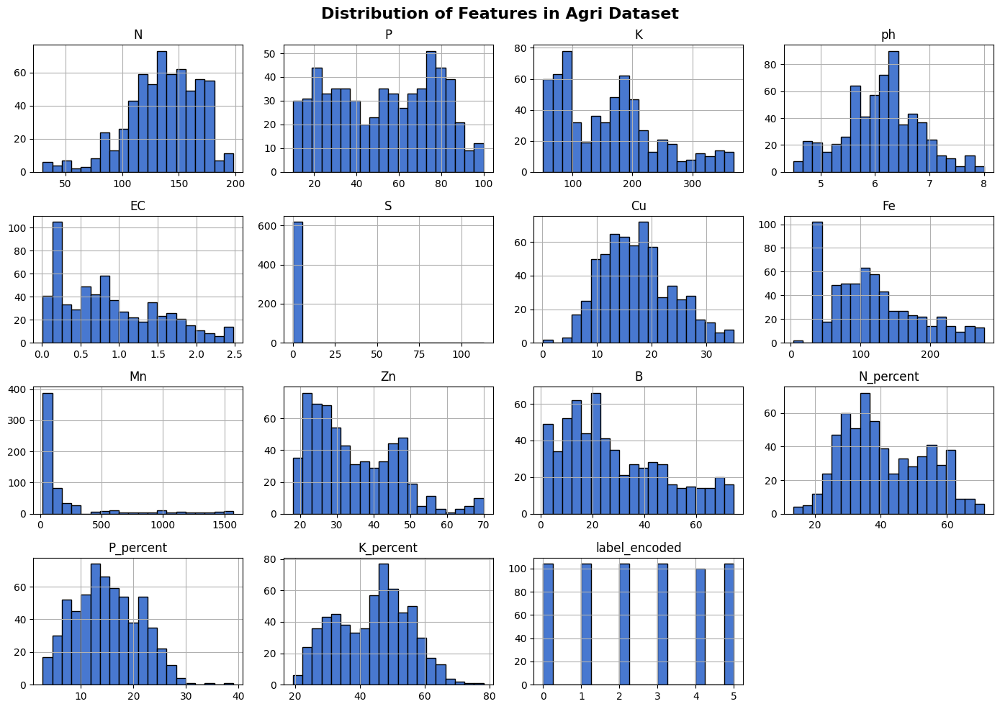

In [87]:
# Plot histograms for all numerical features
df.hist(bins=20, figsize=(14, 10), edgecolor='black')
plt.suptitle('Distribution of Features in Agri Dataset', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

/var/folders/b6/l8w02y4978b6wv7sdk_8f4b80000gn/T/ipykernel_5028/398443371.py:12: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




<Figure size 1400x800 with 0 Axes>

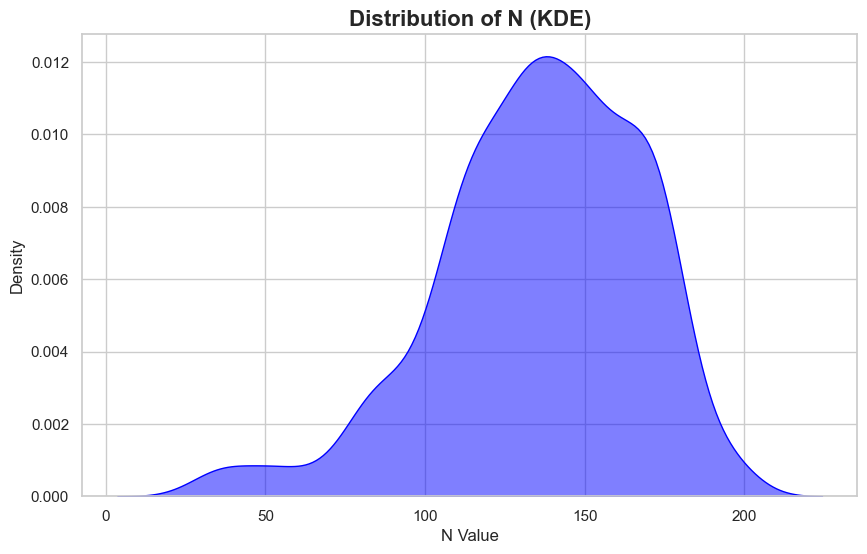

/var/folders/b6/l8w02y4978b6wv7sdk_8f4b80000gn/T/ipykernel_5028/398443371.py:12: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




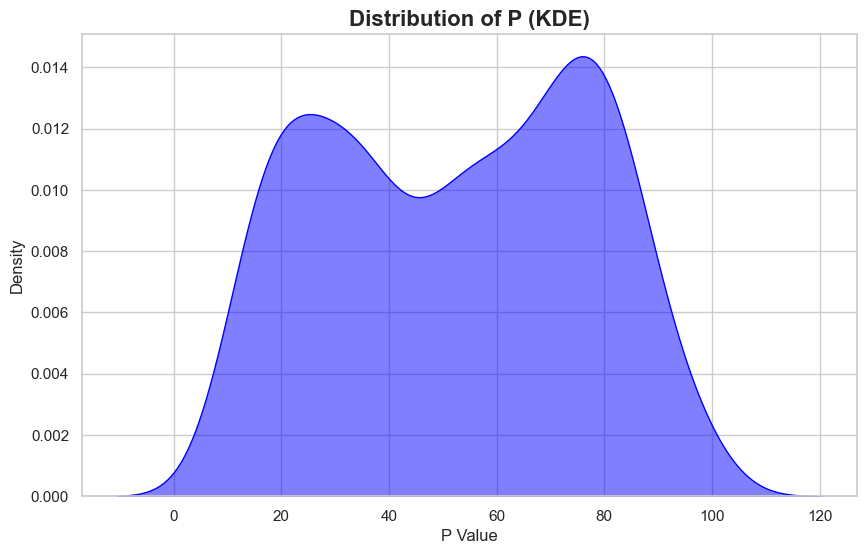

/var/folders/b6/l8w02y4978b6wv7sdk_8f4b80000gn/T/ipykernel_5028/398443371.py:12: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




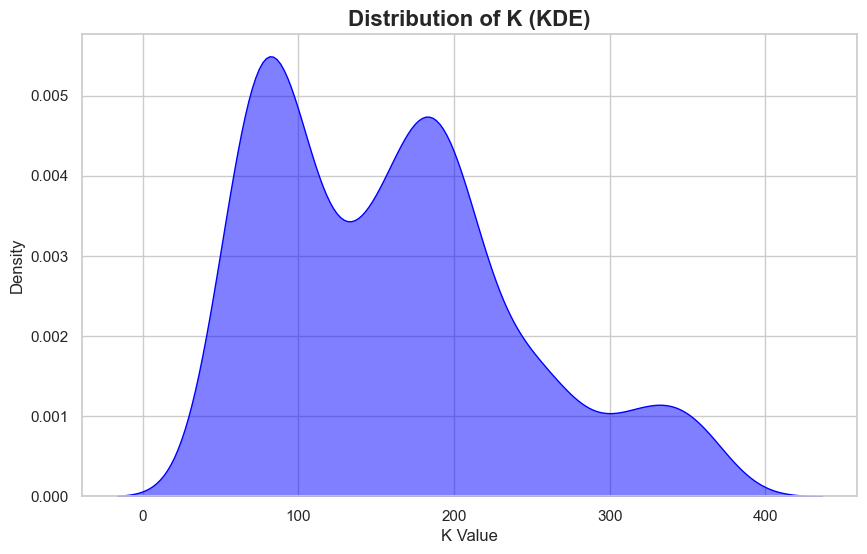

/var/folders/b6/l8w02y4978b6wv7sdk_8f4b80000gn/T/ipykernel_5028/398443371.py:12: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




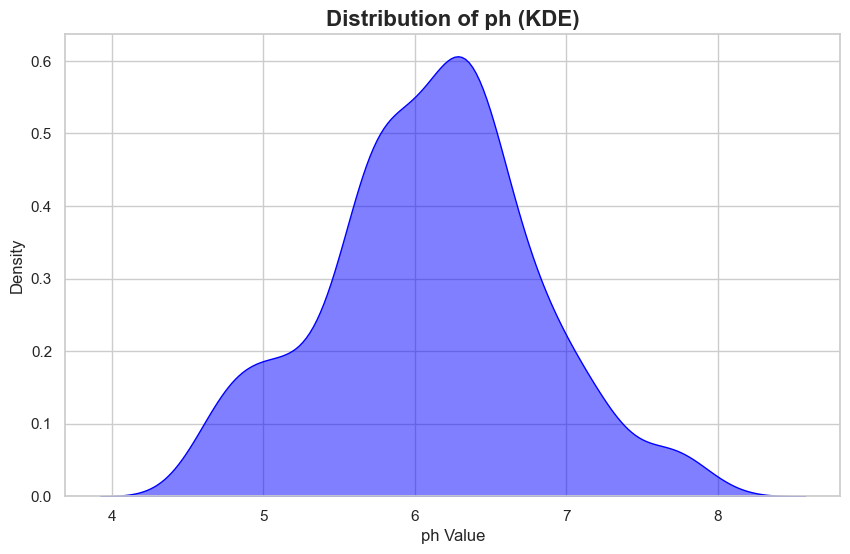

/var/folders/b6/l8w02y4978b6wv7sdk_8f4b80000gn/T/ipykernel_5028/398443371.py:12: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




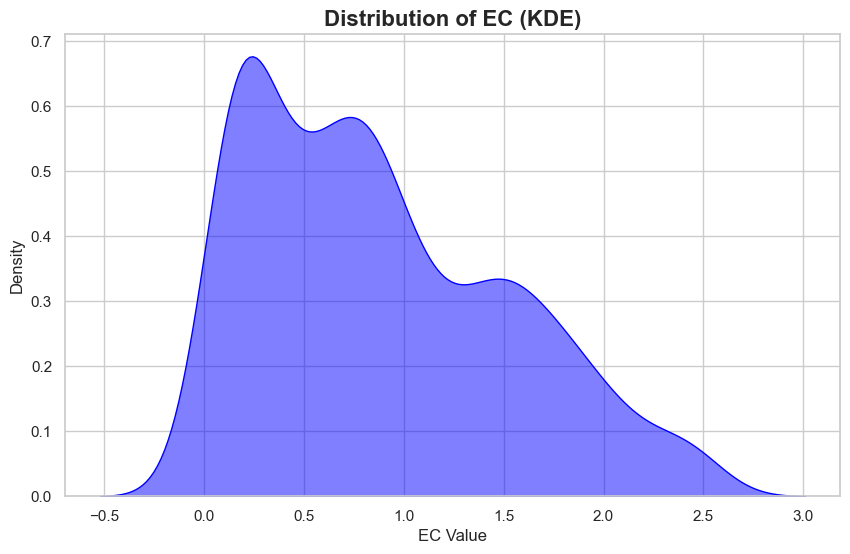

/var/folders/b6/l8w02y4978b6wv7sdk_8f4b80000gn/T/ipykernel_5028/398443371.py:12: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




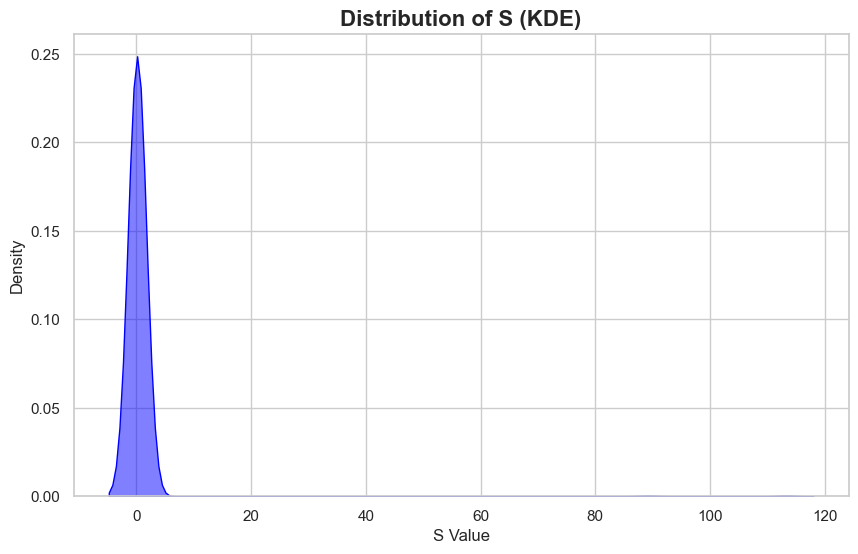

/var/folders/b6/l8w02y4978b6wv7sdk_8f4b80000gn/T/ipykernel_5028/398443371.py:12: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




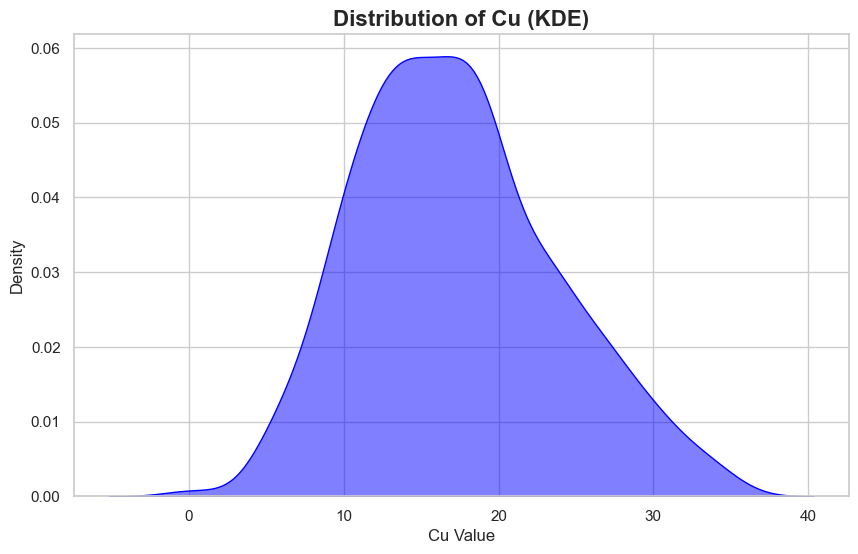

/var/folders/b6/l8w02y4978b6wv7sdk_8f4b80000gn/T/ipykernel_5028/398443371.py:12: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




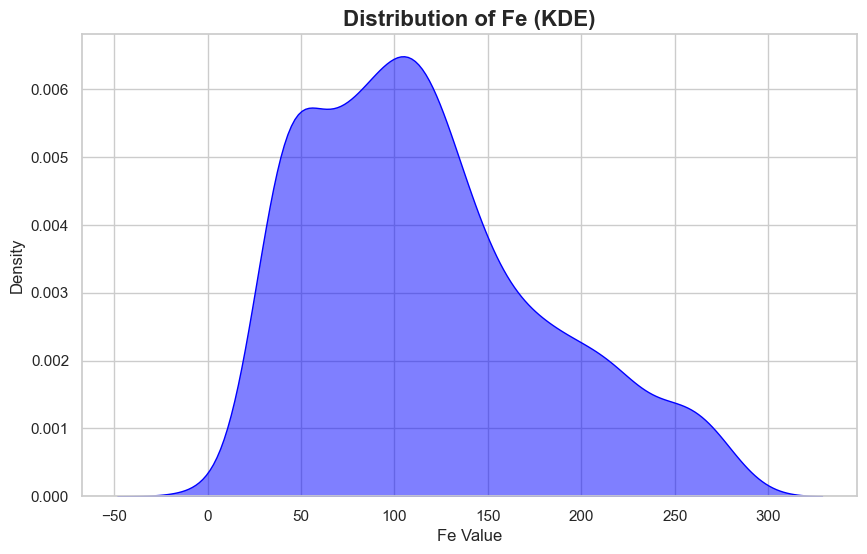

/var/folders/b6/l8w02y4978b6wv7sdk_8f4b80000gn/T/ipykernel_5028/398443371.py:12: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




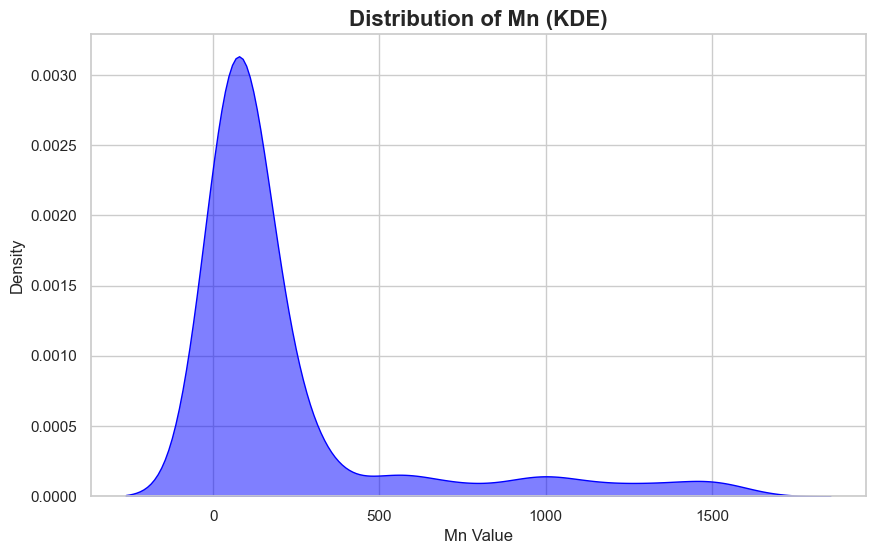

/var/folders/b6/l8w02y4978b6wv7sdk_8f4b80000gn/T/ipykernel_5028/398443371.py:12: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




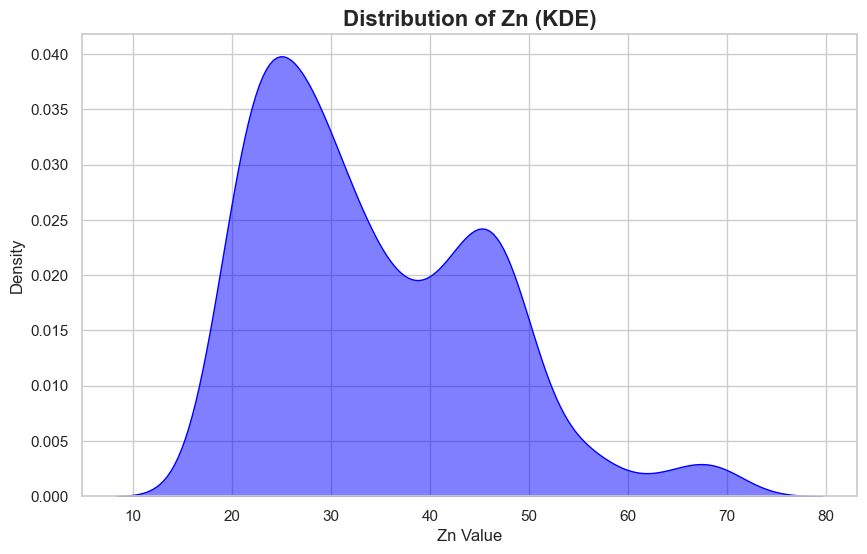

/var/folders/b6/l8w02y4978b6wv7sdk_8f4b80000gn/T/ipykernel_5028/398443371.py:12: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




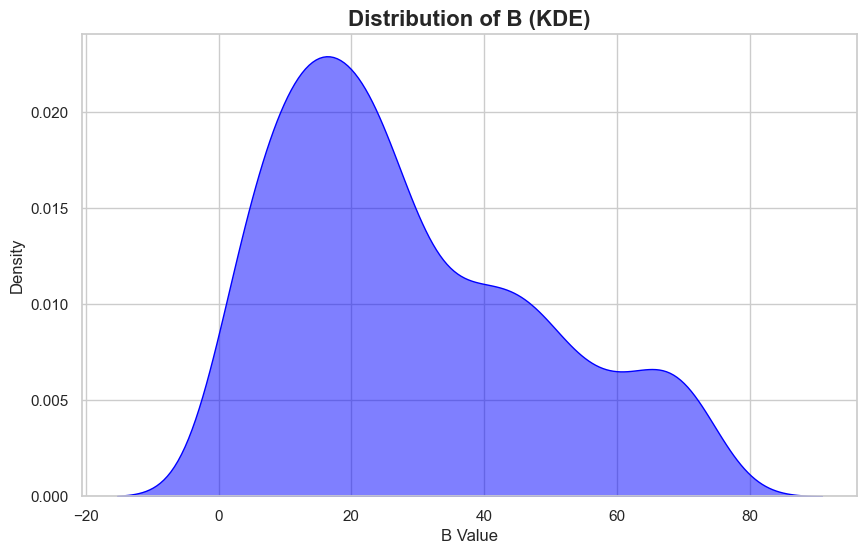

/var/folders/b6/l8w02y4978b6wv7sdk_8f4b80000gn/T/ipykernel_5028/398443371.py:12: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




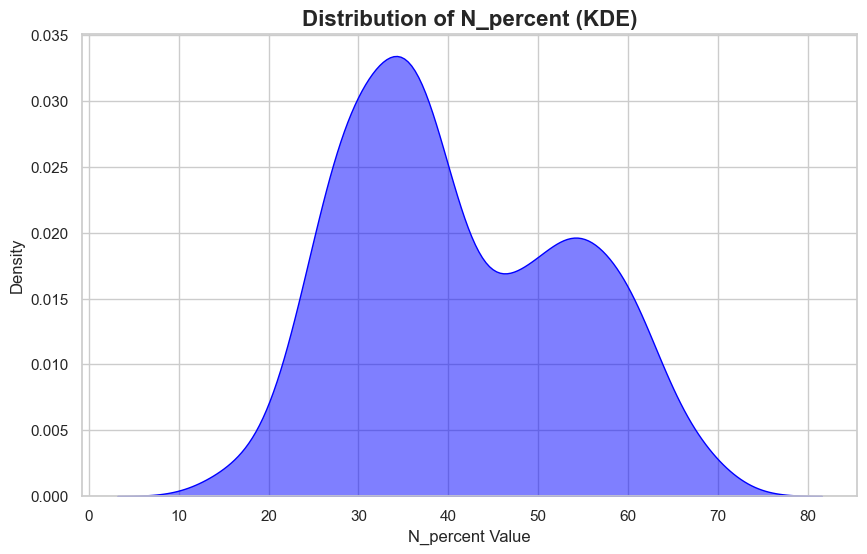

/var/folders/b6/l8w02y4978b6wv7sdk_8f4b80000gn/T/ipykernel_5028/398443371.py:12: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




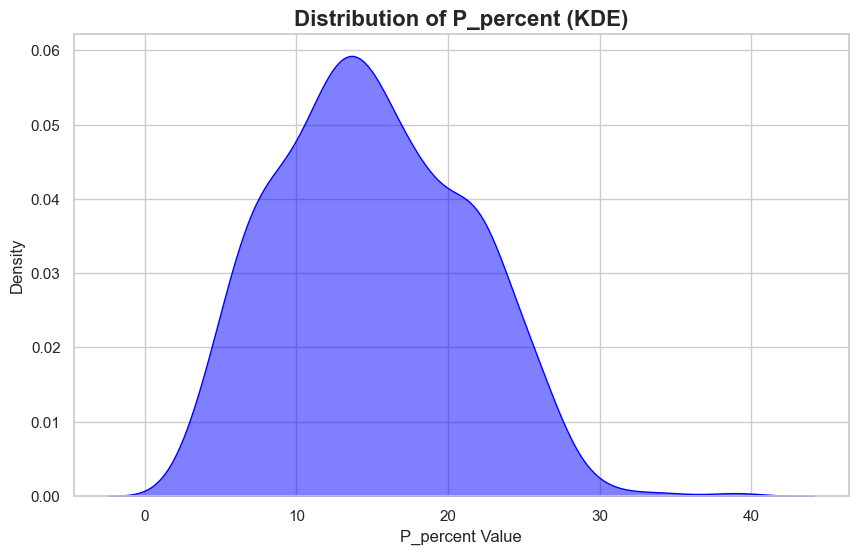

/var/folders/b6/l8w02y4978b6wv7sdk_8f4b80000gn/T/ipykernel_5028/398443371.py:12: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




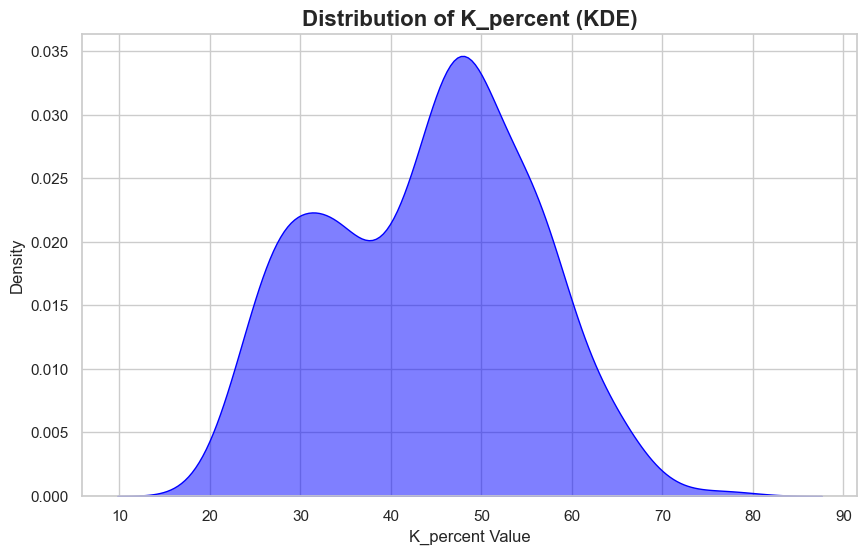

/var/folders/b6/l8w02y4978b6wv7sdk_8f4b80000gn/T/ipykernel_5028/398443371.py:12: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




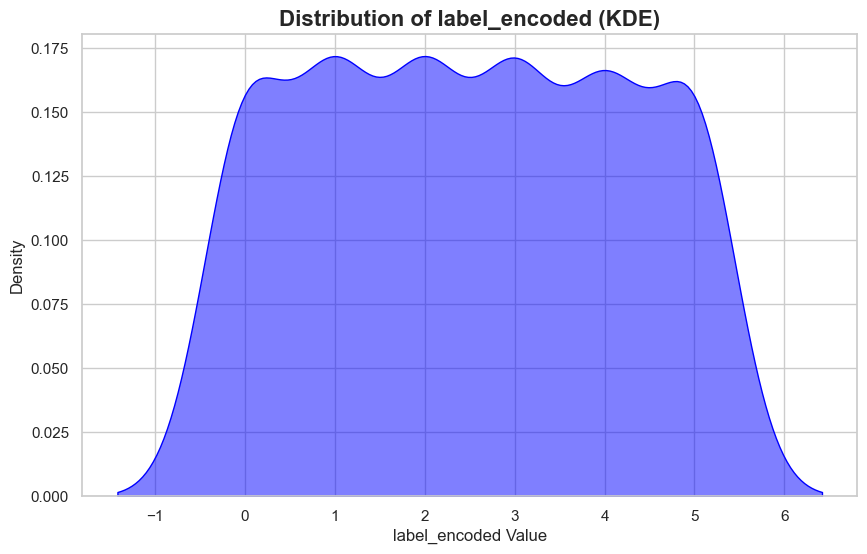

In [88]:
# Assuming 'df' is your Agri dataset
# Select numerical columns (if you want to plot only numerical features)
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns

# Set up the figure size and style for the plot
plt.figure(figsize=(14, 8))
sns.set(style="whitegrid")  # Use a clean grid style

# Plot KDE for each numerical feature
for column in numerical_columns:
    plt.figure(figsize=(10, 6))  # Individual figure for each feature
    sns.kdeplot(df[column], shade=True, color='blue', alpha=0.5)  # Plot KDE with shading
    plt.title(f'Distribution of {column} (KDE)', fontsize=16, fontweight='bold')
    plt.xlabel(f'{column} Value', fontsize=12)
    plt.ylabel('Density', fontsize=12)
    plt.show()


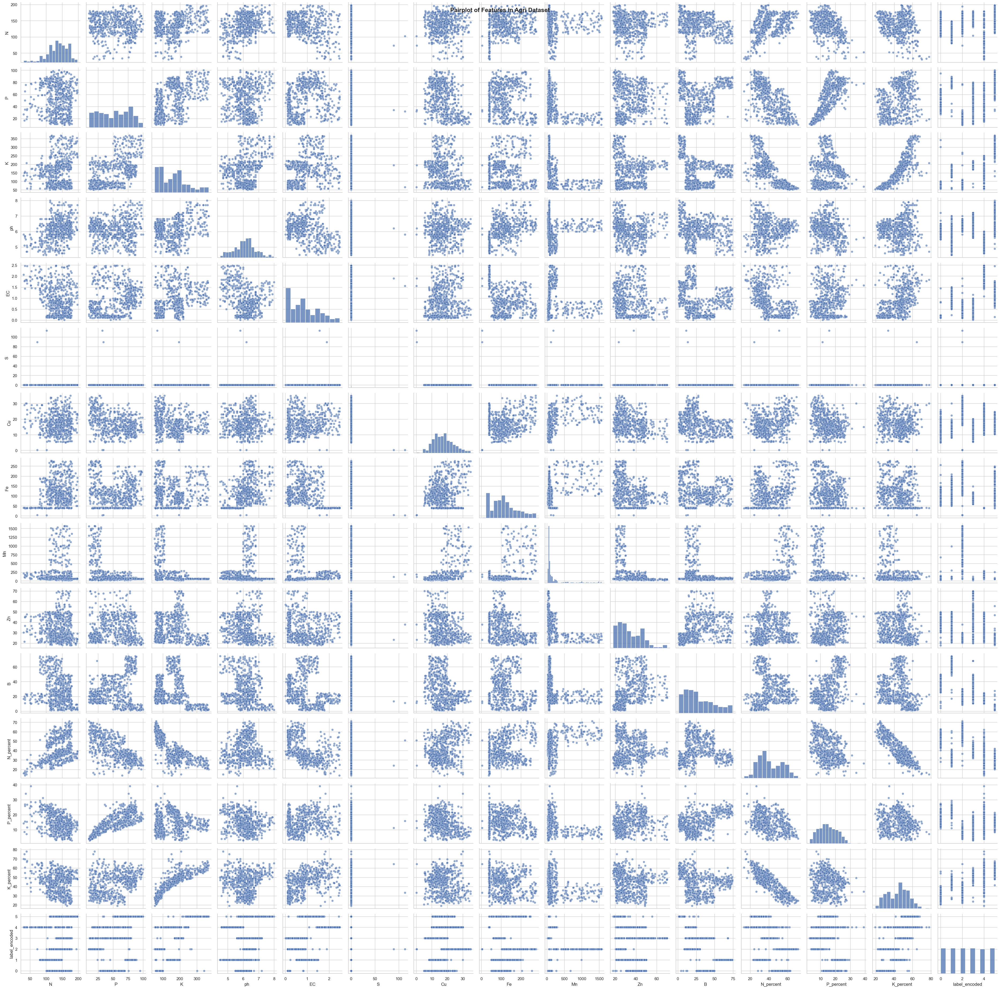

In [89]:
# Plot pairplot (scatterplot matrix) for numerical features
sns.pairplot(df, height=2.5, markers='o', plot_kws={'alpha': 0.6})
plt.suptitle('Pairplot of Features in Agri Dataset', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

/var/folders/b6/l8w02y4978b6wv7sdk_8f4b80000gn/T/ipykernel_5028/4205371685.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




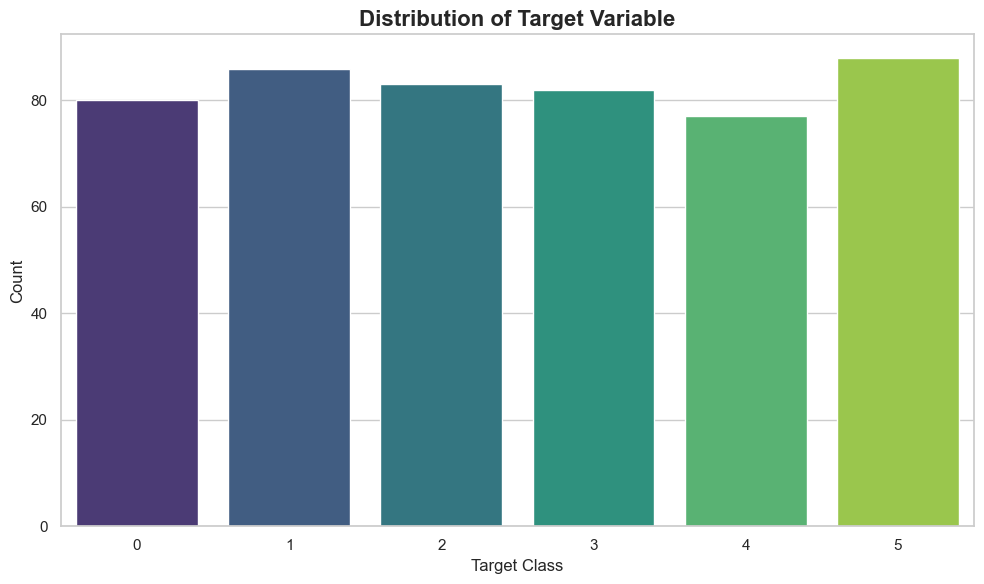

In [90]:
# Assuming 'y_train' is your target variable
plt.figure(figsize=(10, 6))
sns.countplot(x=y_train, palette='viridis')  # Use viridis for a nice color palette
plt.title('Distribution of Target Variable', fontsize=16, fontweight='bold')
plt.xlabel('Target Class', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.tight_layout()
plt.show()

/var/folders/b6/l8w02y4978b6wv7sdk_8f4b80000gn/T/ipykernel_5028/2086581173.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




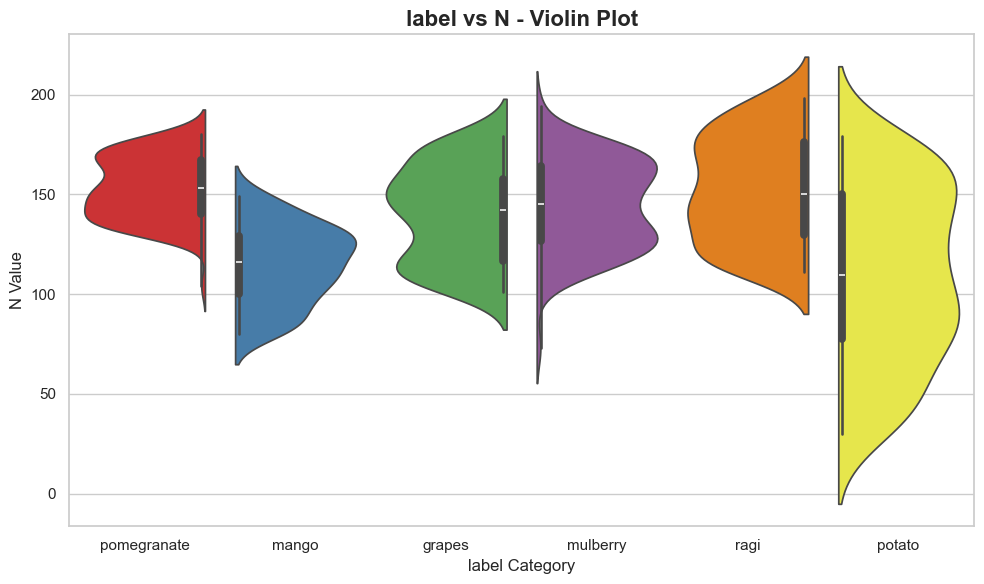

In [91]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'df' is your Agri dataset

# Identify numerical and categorical columns
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns
categorical_columns = df.select_dtypes(include=['object', 'category']).columns

# Check if the dataset has at least one categorical and one numerical column
if len(categorical_columns) > 0 and len(numerical_columns) > 0:
    # Take the first categorical column and numerical column to plot (you can change this logic if needed)
    cat_column = categorical_columns[0]
    num_column = numerical_columns[0]

    # Create a violin plot
    plt.figure(figsize=(10, 6))
    sns.violinplot(x=cat_column, y=num_column, data=df, palette='Set1', split=True)

    plt.title(f'{cat_column} vs {num_column} - Violin Plot', fontsize=16, fontweight='bold')
    plt.xlabel(f'{cat_column} Category', fontsize=12)
    plt.ylabel(f'{num_column} Value', fontsize=12)
    plt.tight_layout()
    plt.show()
else:
    print("Dataset doesn't have both categorical and numerical columns for plotting.")


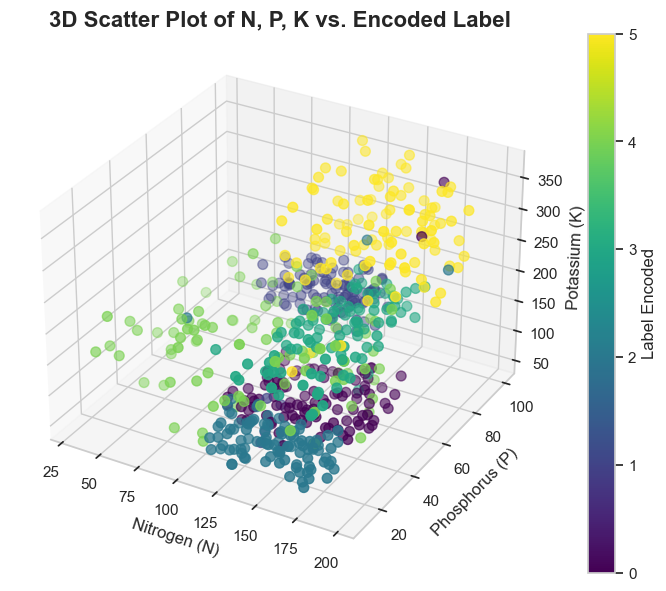

In [92]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import pandas as pd

# Assuming df is the DataFrame already loaded with the data

# Select features for the 3D plot (for example: 'N', 'P', 'K')
X = df[['N', 'P', 'K']]  # Features
y = df['label_encoded']  # Target variable

# Create a 3D scatter plot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot with different colors for each class
scatter = ax.scatter(X['N'], X['P'], X['K'], c=y, cmap='viridis', s=50)

# Add labels for axes
ax.set_xlabel('Nitrogen (N)')
ax.set_ylabel('Phosphorus (P)')
ax.set_zlabel('Potassium (K)')

# Title and color bar
ax.set_title('3D Scatter Plot of N, P, K vs. Encoded Label', fontsize=16, fontweight='bold')
fig.colorbar(scatter, label='Label Encoded')

plt.show()


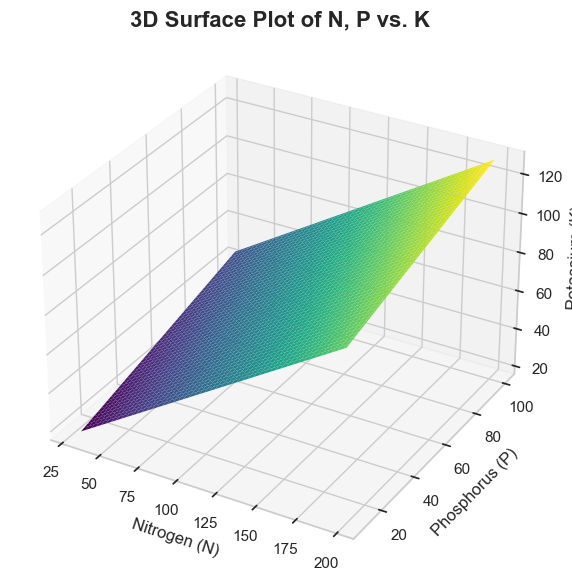

In [93]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Assuming df is the DataFrame with features N, P, and K

# Create a meshgrid for N and P values
N_vals = np.linspace(df['N'].min(), df['N'].max(), 100)
P_vals = np.linspace(df['P'].min(), df['P'].max(), 100)
N_grid, P_grid = np.meshgrid(N_vals, P_vals)

# Calculate K values based on N and P for demonstration (you can replace this with any function)
K_vals = 0.5 * N_grid + 0.3 * P_grid  # Example linear relation

# Create a 3D surface plot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Plotting the surface
ax.plot_surface(N_grid, P_grid, K_vals, cmap='viridis', edgecolor='none')

# Labels and title
ax.set_xlabel('Nitrogen (N)')
ax.set_ylabel('Phosphorus (P)')
ax.set_zlabel('Potassium (K)')
ax.set_title('3D Surface Plot of N, P vs. K', fontsize=16, fontweight='bold')

plt.show()


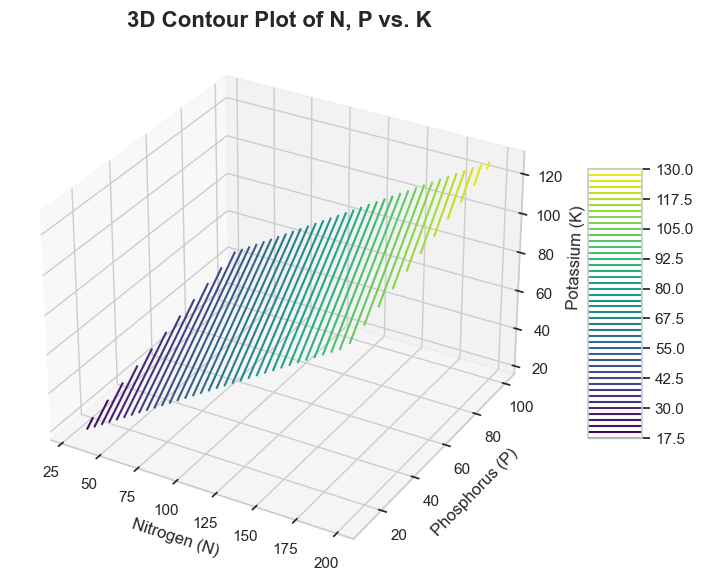

In [94]:
from mpl_toolkits.mplot3d import Axes3D

# Create a 3D contour plot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Plotting contour
contour = ax.contour3D(N_grid, P_grid, K_vals, 50, cmap='viridis')

# Labels and title
ax.set_xlabel('Nitrogen (N)')
ax.set_ylabel('Phosphorus (P)')
ax.set_zlabel('Potassium (K)')
ax.set_title('3D Contour Plot of N, P vs. K', fontsize=16, fontweight='bold')

plt.colorbar(contour, ax=ax, shrink=0.5, aspect=5)
plt.show()


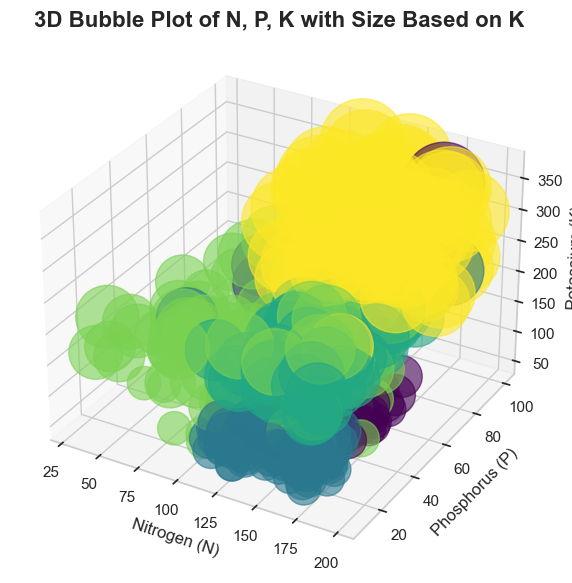

In [95]:
# Create a 3D bubble plot where the size of the point is based on the 'K' feature
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Bubble plot
ax.scatter(df['N'], df['P'], df['K'], c=df['label_encoded'], s=df['K']*10, cmap='viridis', alpha=0.6)

# Labels and title
ax.set_xlabel('Nitrogen (N)')
ax.set_ylabel('Phosphorus (P)')
ax.set_zlabel('Potassium (K)')
ax.set_title('3D Bubble Plot of N, P, K with Size Based on K', fontsize=16, fontweight='bold')

plt.show()


/var/folders/b6/l8w02y4978b6wv7sdk_8f4b80000gn/T/ipykernel_5028/3413609063.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




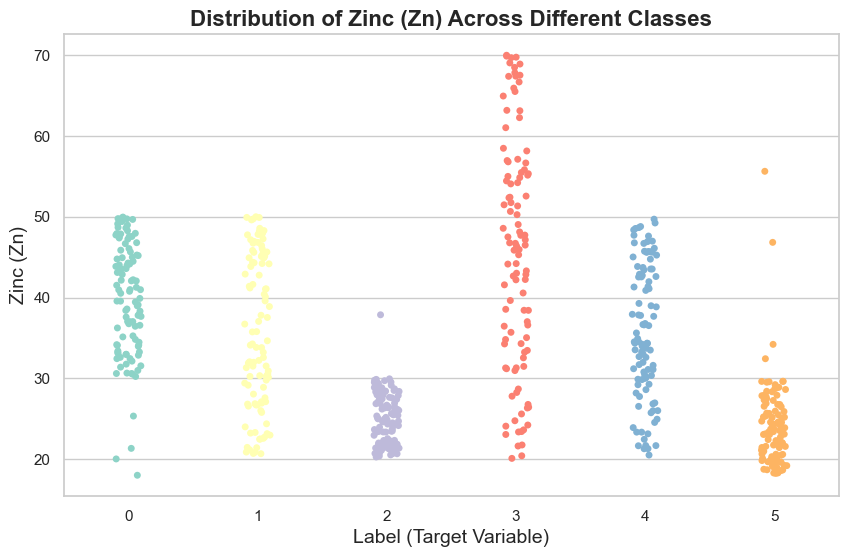

In [96]:
# Strip plot to visualize distribution of a feature with respect to target classes
plt.figure(figsize=(10, 6))
sns.stripplot(x='label_encoded', y='Zn', data=df, jitter=True, palette='Set3')
plt.title('Distribution of Zinc (Zn) Across Different Classes', fontsize=16, fontweight='bold')
plt.xlabel('Label (Target Variable)', fontsize=14)
plt.ylabel('Zinc (Zn)', fontsize=14)
plt.show()



/var/folders/b6/l8w02y4978b6wv7sdk_8f4b80000gn/T/ipykernel_5028/2873818745.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/opt/anaconda3/lib/python3.12/site-packages/seaborn/categorical.py:3399: UserWarning:

84.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.



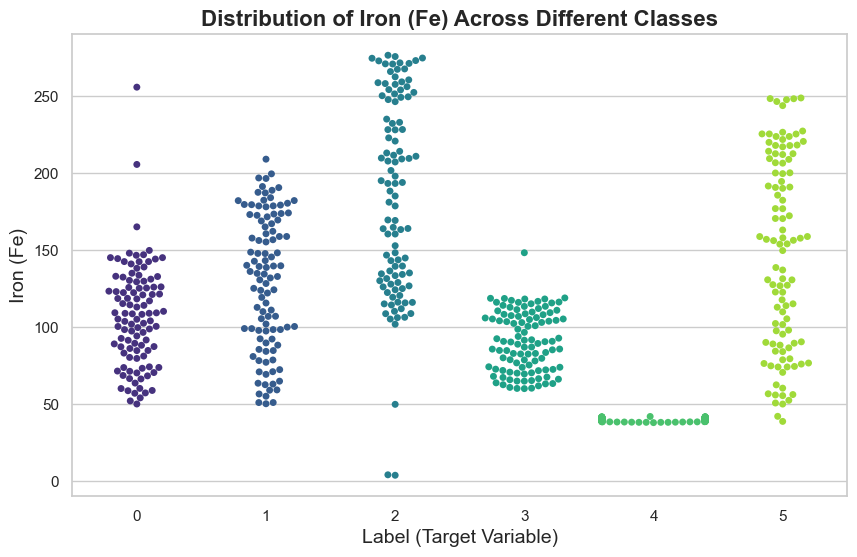

In [97]:
# Swarm plot to visualize the relationship of a feature with the target variable
plt.figure(figsize=(10, 6))
sns.swarmplot(x='label_encoded', y='Fe', data=df, palette='viridis')
plt.title('Distribution of Iron (Fe) Across Different Classes', fontsize=16, fontweight='bold')
plt.xlabel('Label (Target Variable)', fontsize=14)
plt.ylabel('Iron (Fe)', fontsize=14)
plt.show()


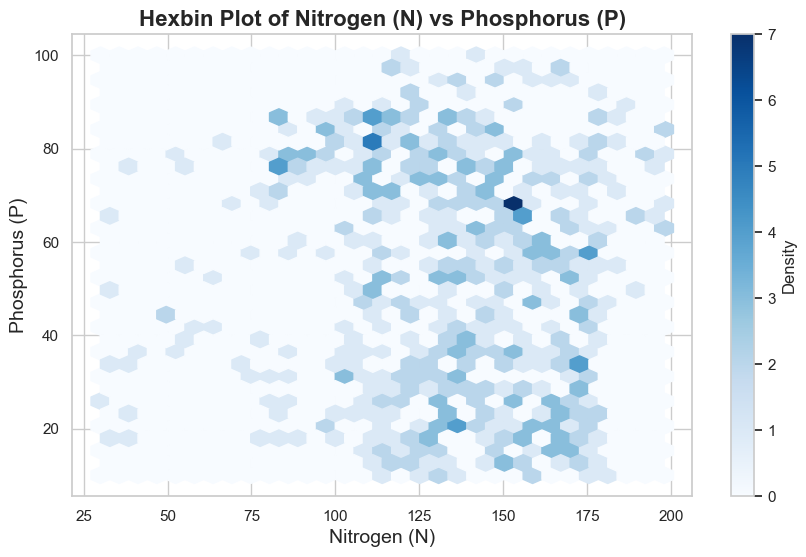

In [98]:
# Hexbin plot for Nitrogen (N) vs Phosphorus (P)
plt.figure(figsize=(10, 6))
plt.hexbin(df['N'], df['P'], gridsize=30, cmap='Blues')
plt.colorbar(label='Density')
plt.title('Hexbin Plot of Nitrogen (N) vs Phosphorus (P)', fontsize=16, fontweight='bold')
plt.xlabel('Nitrogen (N)', fontsize=14)
plt.ylabel('Phosphorus (P)', fontsize=14)
plt.show()

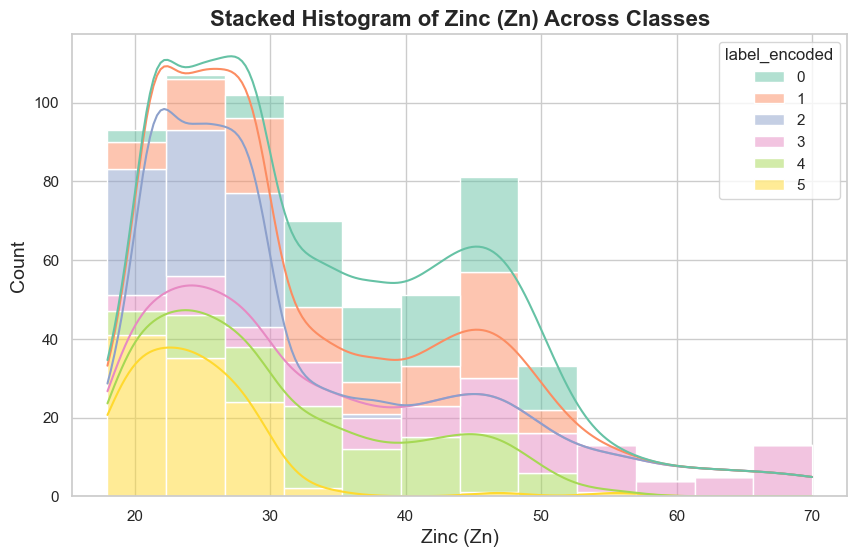

In [99]:
# Stacked histogram of continuous feature grouped by categorical variable
plt.figure(figsize=(10, 6))
sns.histplot(df, x='Zn', hue='label_encoded', multiple='stack', kde=True, palette='Set2')
plt.title('Stacked Histogram of Zinc (Zn) Across Classes', fontsize=16, fontweight='bold')
plt.xlabel('Zinc (Zn)', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.show()


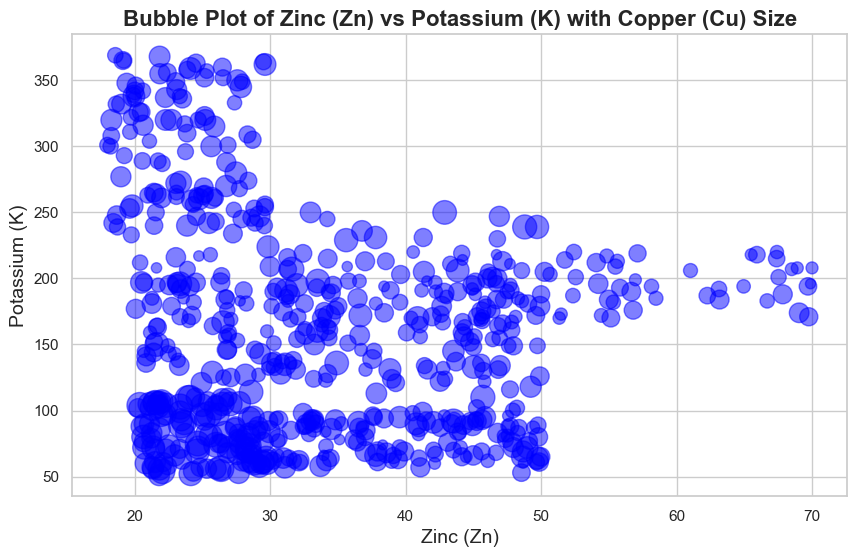

In [100]:
# Bubble plot to visualize two features with a third dimension (size)
plt.figure(figsize=(10, 6))
plt.scatter(df['Zn'], df['K'], s=df['Cu'] * 10, alpha=0.5, color='blue')
plt.title('Bubble Plot of Zinc (Zn) vs Potassium (K) with Copper (Cu) Size', fontsize=16, fontweight='bold')
plt.xlabel('Zinc (Zn)', fontsize=14)
plt.ylabel('Potassium (K)', fontsize=14)
plt.show()

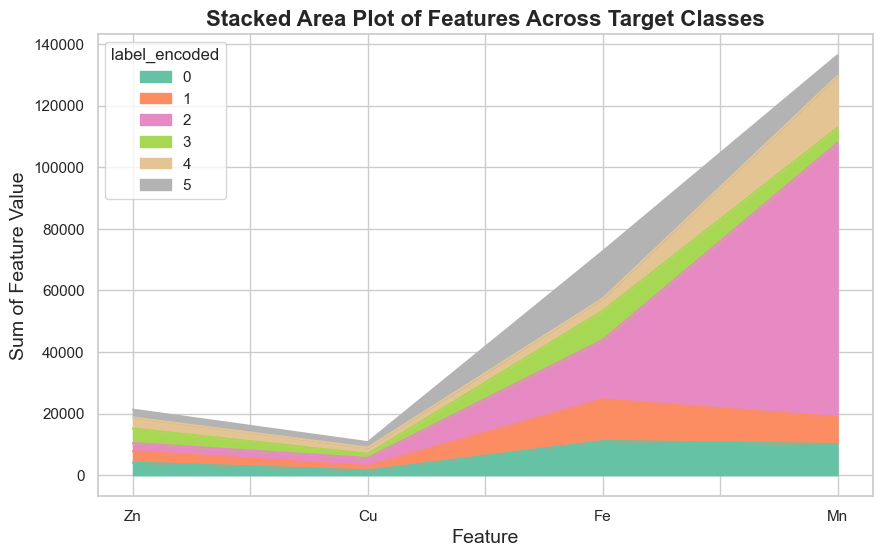

In [101]:
# Stacked area plot for feature comparison across target classes
df.groupby('label_encoded')[['Zn', 'Cu', 'Fe', 'Mn']].sum().T.plot(kind='area', stacked=True, figsize=(10, 6), cmap='Set2')
plt.title('Stacked Area Plot of Features Across Target Classes', fontsize=16, fontweight='bold')
plt.xlabel('Feature', fontsize=14)
plt.ylabel('Sum of Feature Value', fontsize=14)
plt.show()


# Boosting Techniques

In [103]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import classification_report

# Initialize the Gradient Boosting model
gb_clf = GradientBoostingClassifier(n_estimators=100, random_state=42)

# Fit the model to the training data
gb_clf.fit(X_train, y_train)

# Make predictions on the test set
y_pred_gb = gb_clf.predict(X_test)

# Print classification report
print("Gradient Boosting Classifier:")
print(classification_report(y_test, y_pred_gb))


Gradient Boosting Classifier:
              precision    recall  f1-score   support

           0       0.96      0.96      0.96        24
           1       0.94      0.94      0.94        18
           2       1.00      1.00      1.00        21
           3       1.00      0.95      0.98        22
           4       1.00      1.00      1.00        23
           5       0.94      1.00      0.97        16

    accuracy                           0.98       124
   macro avg       0.97      0.98      0.97       124
weighted avg       0.98      0.98      0.98       124



In [104]:
from sklearn.ensemble import AdaBoostClassifier

# Initialize the AdaBoost model with a base estimator
ada_clf = AdaBoostClassifier(n_estimators=50, random_state=42)

# Fit the AdaBoost model to the training data
ada_clf.fit(X_train, y_train)

# Make predictions on the test set
y_pred_ada = ada_clf.predict(X_test)

# Print classification report
print("AdaBoost Classifier:")
print(classification_report(y_test, y_pred_ada))


AdaBoost Classifier:
              precision    recall  f1-score   support

           0       0.56      0.96      0.71        24
           1       1.00      0.06      0.11        18
           2       0.27      0.14      0.19        21
           3       0.40      1.00      0.57        22
           4       1.00      0.70      0.82        23
           5       0.00      0.00      0.00        16

    accuracy                           0.52       124
   macro avg       0.54      0.48      0.40       124
weighted avg       0.56      0.52      0.44       124



/opt/anaconda3/lib/python3.12/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



/var/folders/b6/l8w02y4978b6wv7sdk_8f4b80000gn/T/ipykernel_5028/1652282422.py:14: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




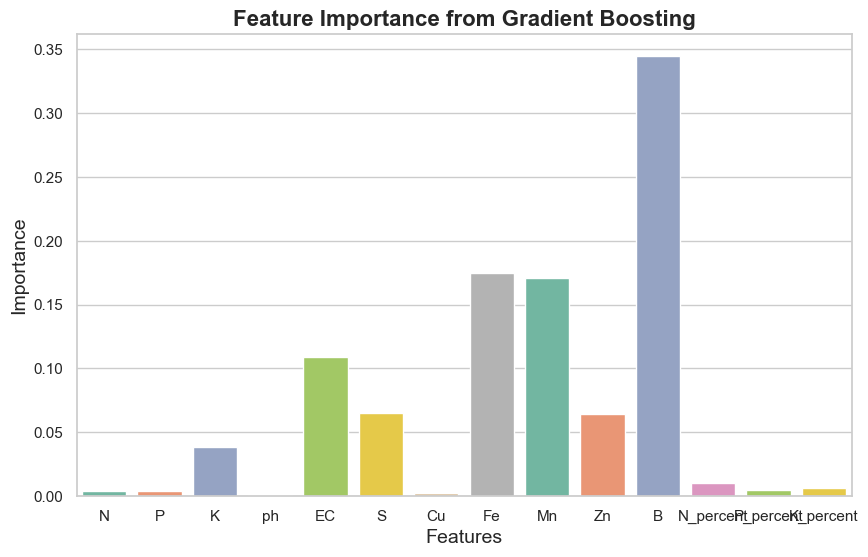

/var/folders/b6/l8w02y4978b6wv7sdk_8f4b80000gn/T/ipykernel_5028/1652282422.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




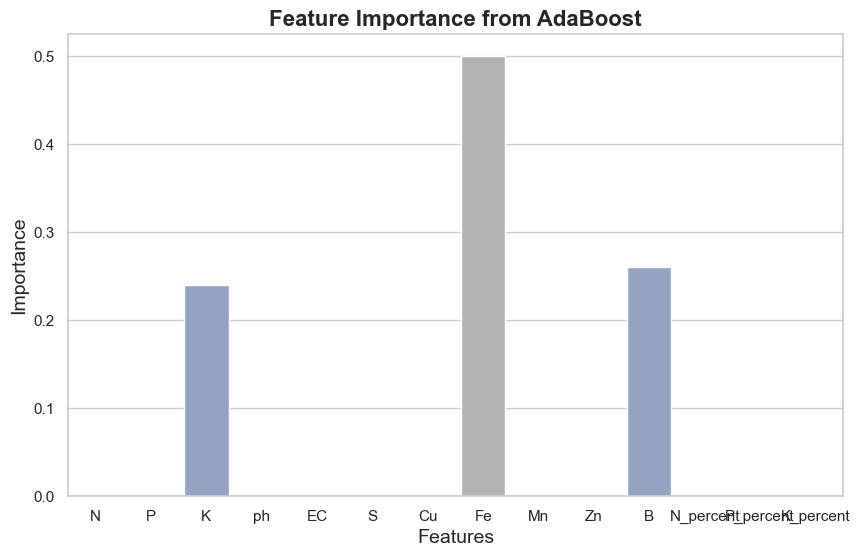

In [105]:
import numpy as np

# Feature importance from Gradient Boosting model
gb_feature_importance = gb_clf.feature_importances_

# Feature importance from AdaBoost model
ada_feature_importance = ada_clf.feature_importances_

# Feature names
feature_names = X_train.columns  # Assuming you are using a DataFrame for X_train

# Plot feature importance for Gradient Boosting
plt.figure(figsize=(10, 6))
sns.barplot(x=feature_names, y=gb_feature_importance, palette='Set2')
plt.title('Feature Importance from Gradient Boosting', fontsize=16, fontweight='bold')
plt.xlabel('Features', fontsize=14)
plt.ylabel('Importance', fontsize=14)
plt.show()

# Plot feature importance for AdaBoost
plt.figure(figsize=(10, 6))
sns.barplot(x=feature_names, y=ada_feature_importance, palette='Set2')
plt.title('Feature Importance from AdaBoost', fontsize=16, fontweight='bold')
plt.xlabel('Features', fontsize=14)
plt.ylabel('Importance', fontsize=14)
plt.show()


In [106]:
# Import necessary libraries
import xgboost as xgb
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split

# Initialize XGBoost Classifier
xgb_clf = xgb.XGBClassifier(
    n_estimators=100,       # Number of trees
    learning_rate=0.1,      # Learning rate (shrinkage)
    max_depth=5,            # Depth of each tree
    subsample=0.8,          # Fraction of samples used for each tree
    colsample_bytree=0.8,   # Fraction of features used for each tree
    random_state=42         # Seed for reproducibility
)

# Train the model
xgb_clf.fit(X_train, y_train)

# Make predictions
y_pred = xgb_clf.predict(X_test)

# Evaluate the model
print("Classification Report:")
print(classification_report(y_test, y_pred))


Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.96      0.96        24
           1       0.94      0.94      0.94        18
           2       1.00      1.00      1.00        21
           3       1.00      0.95      0.98        22
           4       1.00      1.00      1.00        23
           5       0.94      1.00      0.97        16

    accuracy                           0.98       124
   macro avg       0.97      0.98      0.97       124
weighted avg       0.98      0.98      0.98       124



/var/folders/b6/l8w02y4978b6wv7sdk_8f4b80000gn/T/ipykernel_5028/325071050.py:19: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




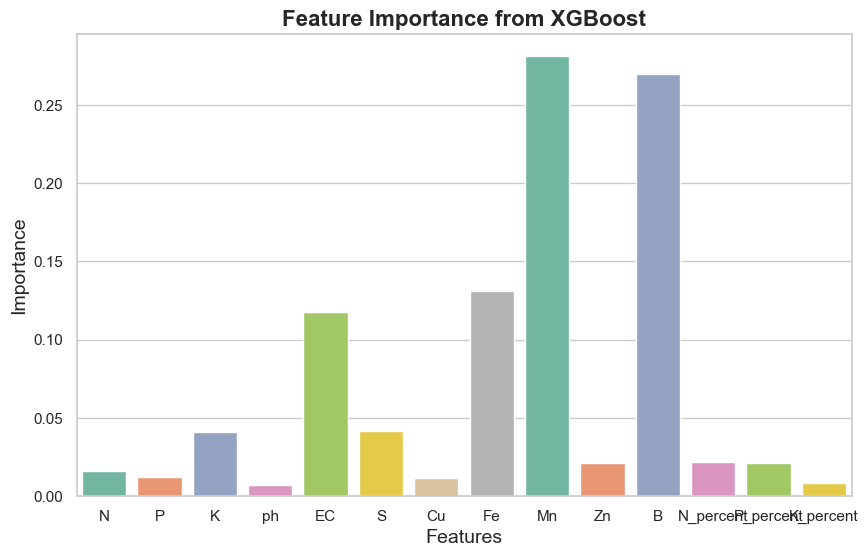

In [107]:
import xgboost as xgb
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have already prepared your data (X_train and y_train)

# Train an XGBoost model
xgb_clf = xgb.XGBClassifier(n_estimators=100, learning_rate=0.1, max_depth=5, random_state=42)
xgb_clf.fit(X_train, y_train)

# Get feature importances from the XGBoost model
xgb_feature_importance = xgb_clf.feature_importances_

# Feature names (assuming X_train is a DataFrame)
feature_names = X_train.columns  # Update this if X_train is a NumPy array

# Plot feature importance for XGBoost
plt.figure(figsize=(10, 6))
sns.barplot(x=feature_names, y=xgb_feature_importance, palette='Set2')
plt.title('Feature Importance from XGBoost', fontsize=16, fontweight='bold')
plt.xlabel('Features', fontsize=14)
plt.ylabel('Importance', fontsize=14)
plt.show()


In [108]:
from sklearn.metrics import classification_report
import pandas as pd
import xgboost as xgb
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier
import seaborn as sns
import matplotlib.pyplot as plt

# Initialize the classifiers for comparison
classifiers = [
    ("Gradient Boosting", GradientBoostingClassifier(n_estimators=100, random_state=42)),
    ("AdaBoost", AdaBoostClassifier(n_estimators=50, random_state=42)),
    ("XGBoost", xgb.XGBClassifier(n_estimators=100, learning_rate=0.1, max_depth=5, subsample=0.8, colsample_bytree=0.8, random_state=42))
]

# Create a table of metrics for better comparison
metrics = {}

# Train and evaluate each classifier
for name, clf in classifiers:
    clf.fit(X_train, y_train)  # Fit the model
    y_pred = clf.predict(X_test)  # Make predictions
    report = classification_report(y_test, y_pred, output_dict=True)  # Get classification report
    
    # Store relevant metrics
    metrics[name] = {
        'Accuracy': round(report['accuracy'], 2),
        'Precision (Macro)': round(report['macro avg']['precision'], 2),
        'Recall (Macro)': round(report['macro avg']['recall'], 2),
        'F1-Score (Macro)': round(report['macro avg']['f1-score'], 2)
    }

# Convert the metrics dictionary into a DataFrame for easier presentation
metrics_df = pd.DataFrame(metrics).T

# Apply custom styling with new coloring for visual appeal
def style_metrics_df(df):
    # Style the DataFrame for better readability with new color choices
    return df.style.format("{:.2f}") \
        .highlight_max(axis=0, color='lightpink', subset=['Accuracy', 'Precision (Macro)', 'Recall (Macro)', 'F1-Score (Macro)']) \
        .highlight_min(axis=0, color='teal', subset=['Accuracy', 'Precision (Macro)', 'Recall (Macro)', 'F1-Score (Macro)']) \
        .set_caption("Comparison of Boosting Techniques Based on Key Metrics") \
        .set_table_styles(
            [{'selector': 'thead th', 'props': [('background-color', '#f0f0f0'), ('font-weight', 'bold'), ('font-size', '14px')]},
             {'selector': 'tbody td', 'props': [('font-size', '12px')]},
             {'selector': 'caption', 'props': [('caption-side', 'top'), ('font-size', '16px'), ('font-weight', 'bold')]}])

# Display the styled DataFrame with comparisons
styled_df = style_metrics_df(metrics_df)
styled_df


/opt/anaconda3/lib/python3.12/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



,Accuracy,Precision (Macro),Recall (Macro),F1-Score (Macro)
Gradient Boosting,0.98,0.97,0.98,0.97
AdaBoost,0.52,0.54,0.48,0.40
XGBoost,0.98,0.97,0.98,0.97
